In [1]:
import numpy
import pandas as pd
import xlwt
from xlwt import Workbook
from __future__ import print_function, division
from data_loader import ImageFolder
import torch.nn.functional as F
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import torchvision.utils as utils
from torch.autograd import Variable

In [84]:
#Loading and normalizinng CIFAR-10
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])


trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, 
                                          shuffle=True, batch_size = 100, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=100,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck')

save_path = '/Users/suchethas/auto_res'

Files already downloaded and verified
Files already downloaded and verified


In [97]:
#To view input
def imshow(img):
    img = (img * 0.5) + 0.5     # unnormalize
    npimg = img.detach().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
    
def imshow_decoder(ima):
    with torch.no_grad():
        ima[0] = (ima[0] - torch.min(ima[0]))/(torch.max(ima[0]) - torch.min(ima[0]))
        ima[1] = (ima[1] - torch.min(ima[1]))/(torch.max(ima[1]) - torch.min(ima[1]))
        ima[2] = (ima[2] - torch.min(ima[2]))/(torch.max(ima[2]) - torch.min(ima[2]))
        npimg = ima.detach().numpy()
        print(npimg.shape)
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.show()
    
    #img.add_(-min).div_(max - min + 1e-5)

    

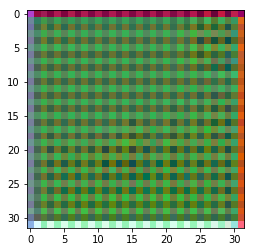

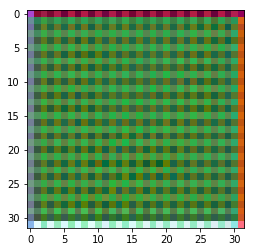

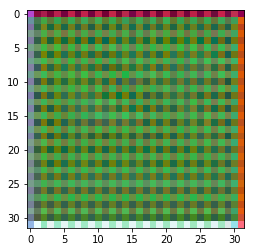

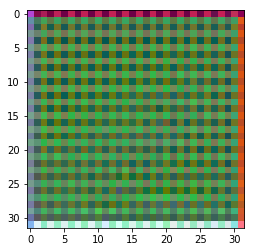

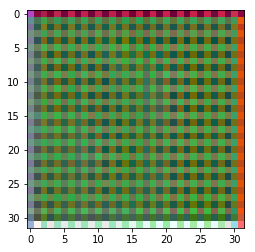

...

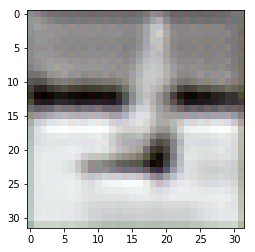

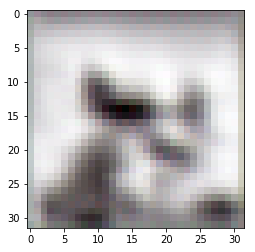

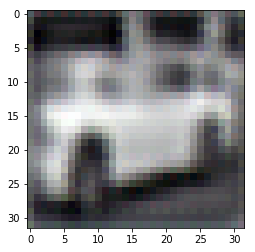

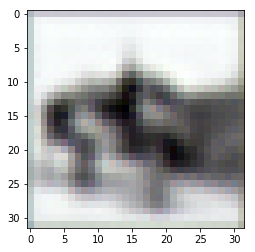

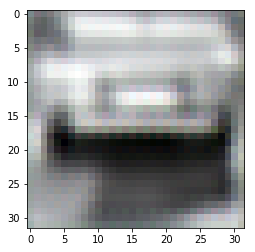

epoch [1/5], loss:0.0405


In [86]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder,self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1), # input_channels, output_channels, filter_size, stride
            nn.ReLU(True),
            nn.Conv2d(3, 32, kernel_size=2, stride=2, padding=0),
            nn.ReLU(True), #inplace = True
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, kernel_size=2, stride=2, padding=0),
            nn.ReLU(True),
            nn.ConvTranspose2d(3, 3, kernel_size=3, stride=1, padding=1),
            #nn.ReLU(True),
       
        )
        
    def forward(self,x):
        x=self.encoder(x) # x.shape = torch.Size([1, 5, 14, 14])
        x=self.decoder(x)
        return x
    


model = Autoencoder().cpu()
distance = nn.MSELoss()
#optimizer = torch.optim.Adam(model.parameters(),weight_decay=1e-5)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
i = 1
num_epochs = 5
for epoch in range(1):
    for data in trainloader:
        img, _ = data
        
        # ===================forward=====================
        output = model(img)
        #print(output[1])
        with torch.no_grad():
            imshow_decoder(output[1])
#         print(output[1])
#         plt.imshow(np.transpose(output[1].detach().numpy(),( 1, 2, 0)))
#         plt.show()
        #imshow_d(torchvision.utils.make_grid(output[1,:,:,:]))
        loss = distance(output, img)
        # ===================backward====================
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        i = i+1
    print('epoch [{}/{}], loss:{:.4f}'.format(epoch+1, num_epochs, loss.item()))

epoch [1/5], loss:0.0080
epoch [2/5], loss:0.0092
epoch [3/5], loss:0.0064
epoch [4/5], loss:0.0043
(3, 32, 32)


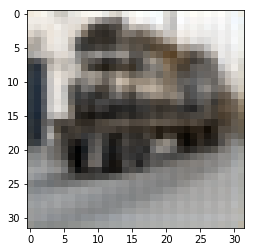

(3, 32, 32)


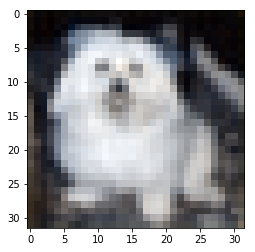

(3, 32, 32)


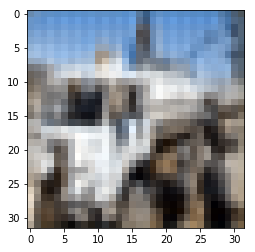

(3, 32, 32)


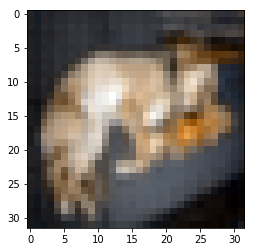

(3, 32, 32)


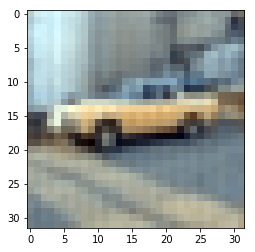

(3, 32, 32)


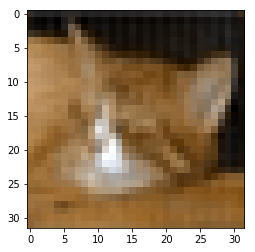

(3, 32, 32)


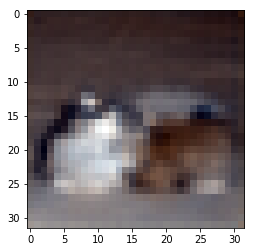

(3, 32, 32)


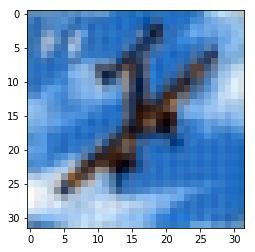

(3, 32, 32)


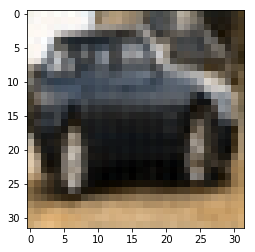

(3, 32, 32)


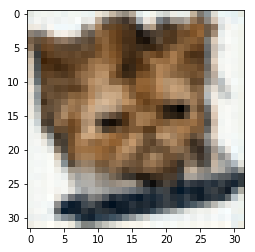

(3, 32, 32)


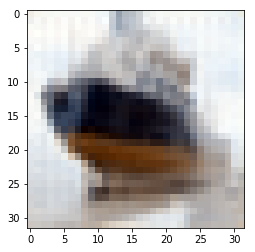

(3, 32, 32)


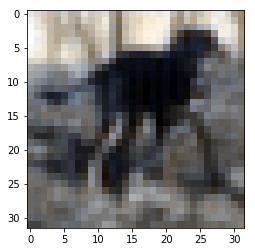

(3, 32, 32)


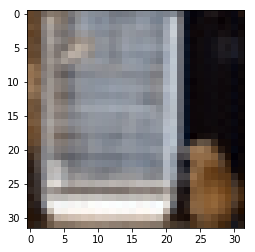

(3, 32, 32)


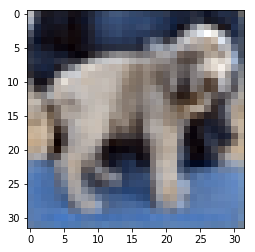

(3, 32, 32)


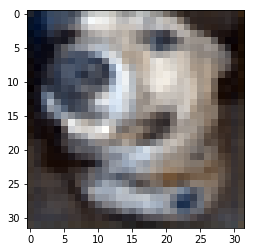

(3, 32, 32)


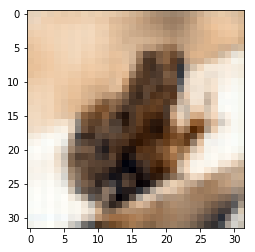

(3, 32, 32)


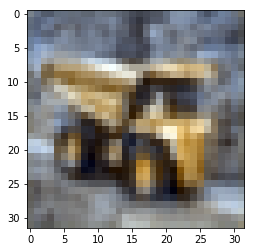

(3, 32, 32)


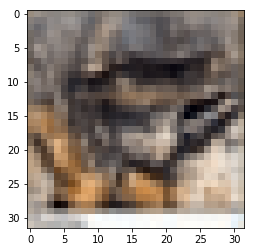

(3, 32, 32)


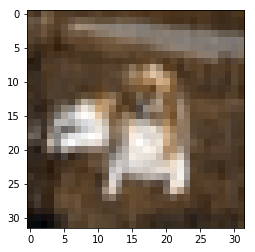

(3, 32, 32)


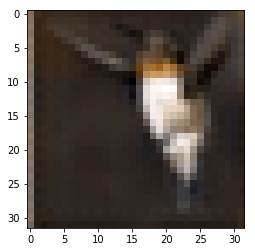

(3, 32, 32)


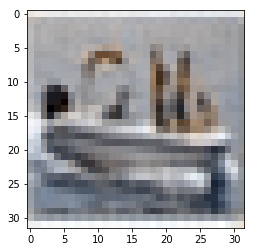

(3, 32, 32)


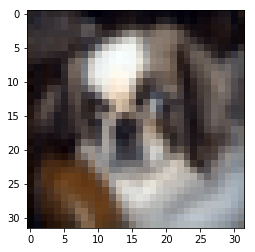

(3, 32, 32)


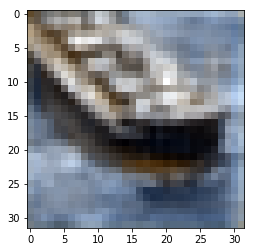

(3, 32, 32)


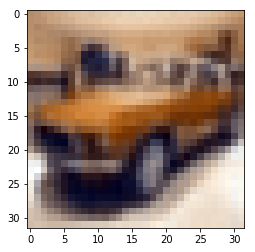

(3, 32, 32)


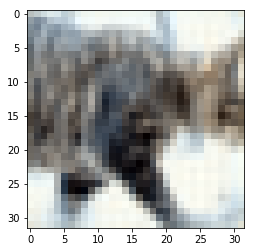

(3, 32, 32)


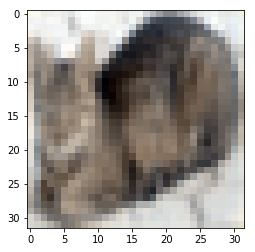

(3, 32, 32)


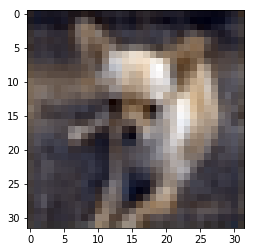

(3, 32, 32)


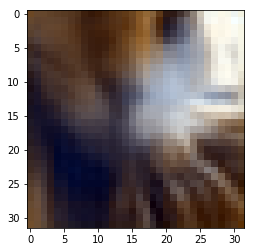

(3, 32, 32)


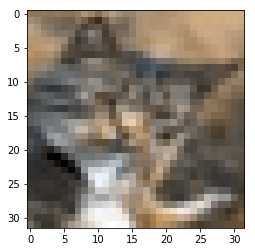

(3, 32, 32)


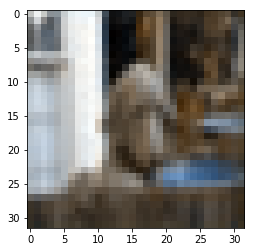

(3, 32, 32)


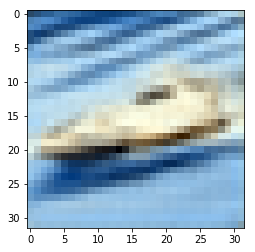

(3, 32, 32)


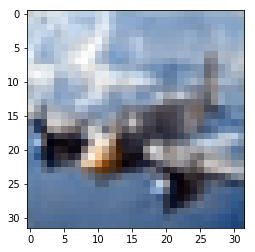

(3, 32, 32)


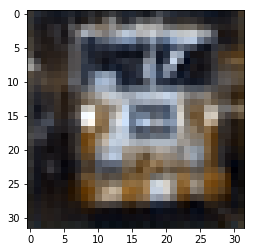

(3, 32, 32)


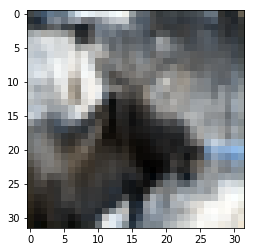

(3, 32, 32)


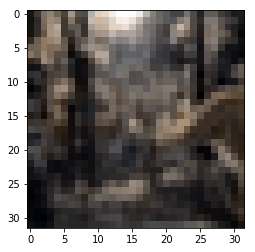

(3, 32, 32)


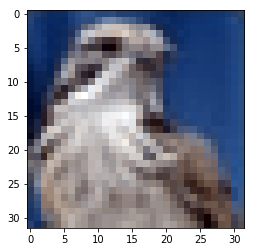

(3, 32, 32)


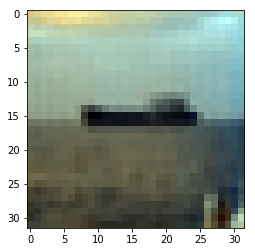

(3, 32, 32)


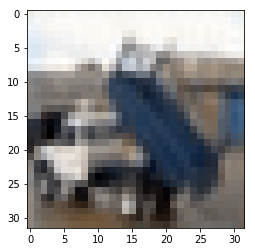

(3, 32, 32)


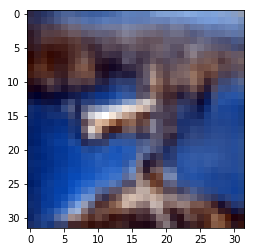

(3, 32, 32)


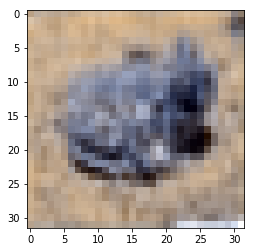

(3, 32, 32)


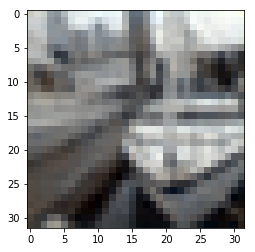

(3, 32, 32)


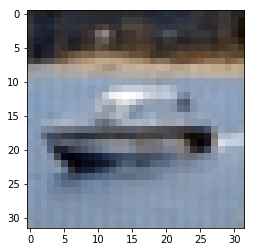

(3, 32, 32)


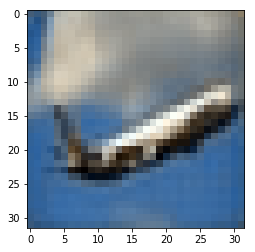

(3, 32, 32)


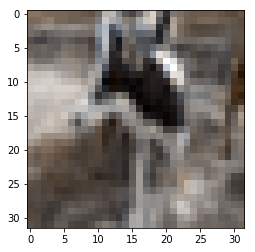

(3, 32, 32)


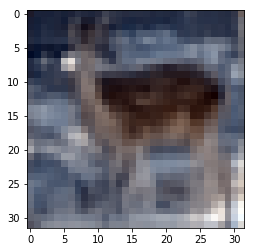

(3, 32, 32)


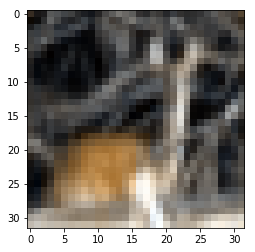

(3, 32, 32)


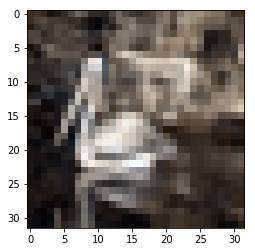

(3, 32, 32)


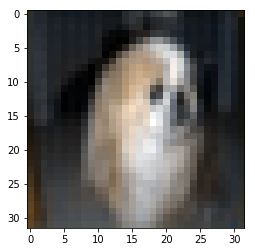

(3, 32, 32)


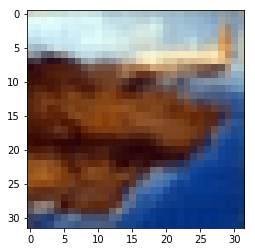

(3, 32, 32)


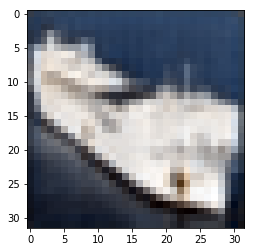

(3, 32, 32)


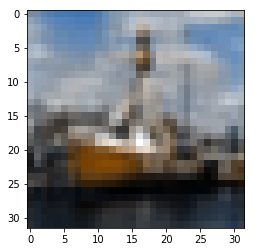

(3, 32, 32)


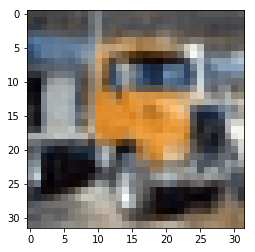

(3, 32, 32)


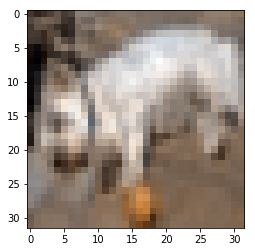

(3, 32, 32)


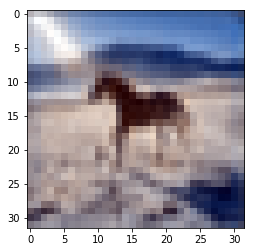

(3, 32, 32)


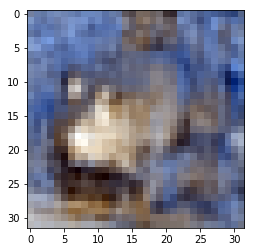

(3, 32, 32)


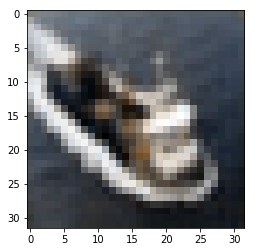

(3, 32, 32)


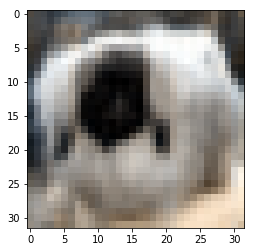

(3, 32, 32)


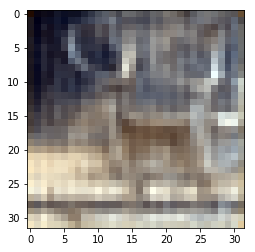

(3, 32, 32)


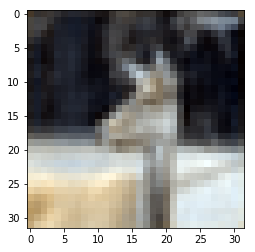

(3, 32, 32)


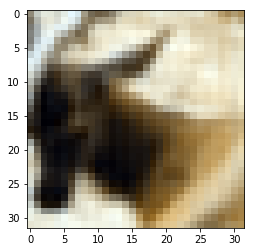

(3, 32, 32)


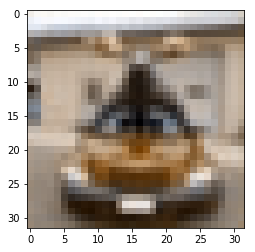

(3, 32, 32)


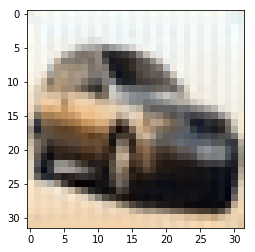

(3, 32, 32)


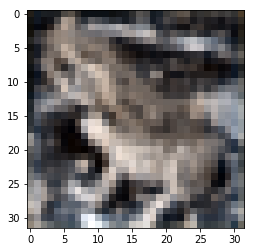

(3, 32, 32)


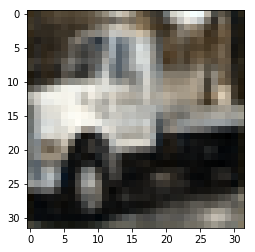

(3, 32, 32)


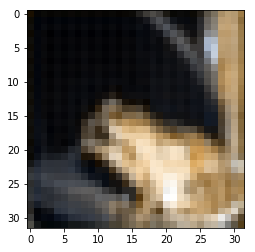

(3, 32, 32)


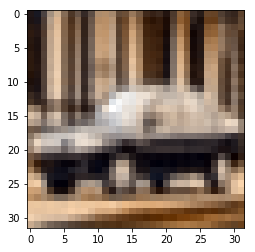

(3, 32, 32)


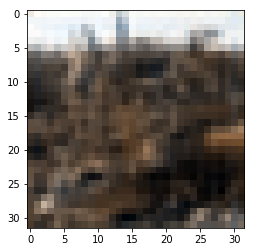

(3, 32, 32)


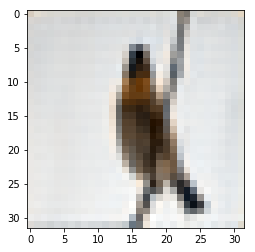

(3, 32, 32)


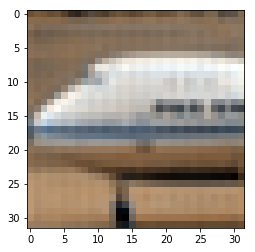

(3, 32, 32)


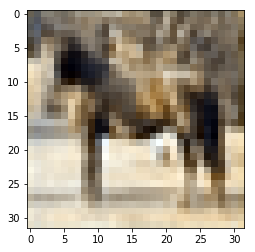

(3, 32, 32)


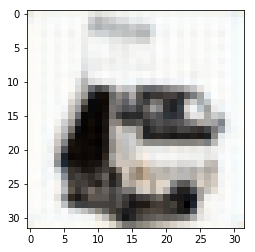

(3, 32, 32)


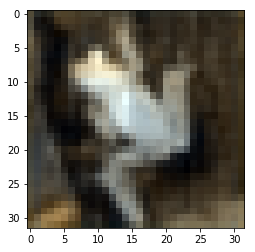

(3, 32, 32)


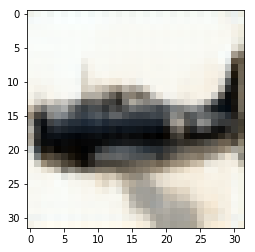

(3, 32, 32)


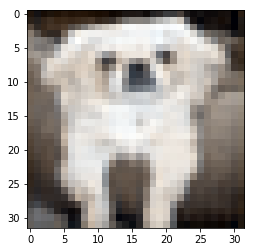

(3, 32, 32)


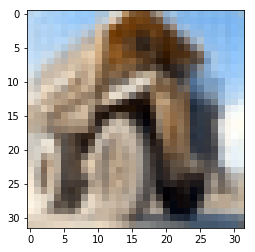

(3, 32, 32)


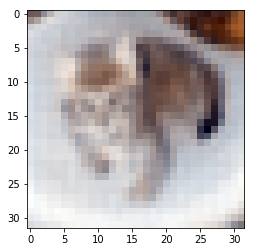

(3, 32, 32)


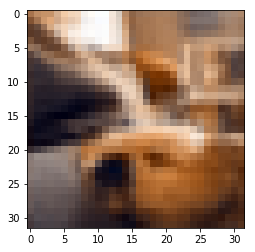

(3, 32, 32)


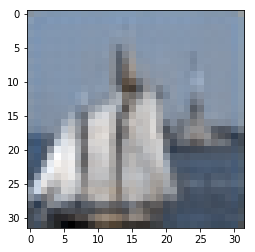

(3, 32, 32)


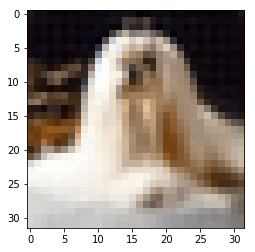

(3, 32, 32)


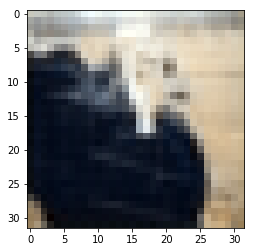

(3, 32, 32)


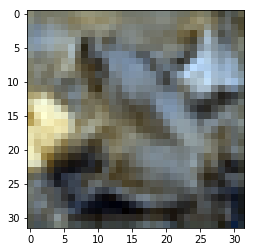

(3, 32, 32)


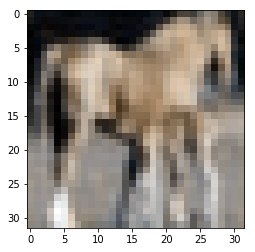

(3, 32, 32)


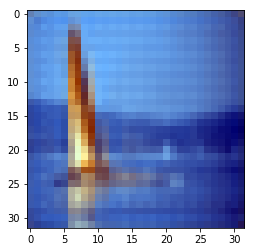

(3, 32, 32)


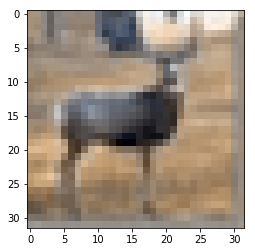

(3, 32, 32)


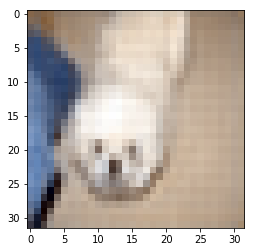

(3, 32, 32)


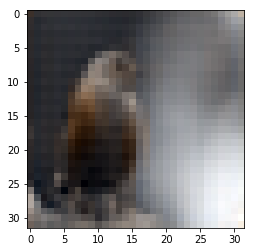

(3, 32, 32)


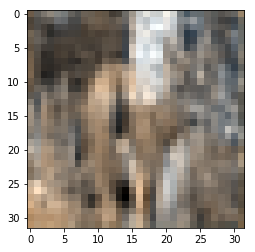

(3, 32, 32)


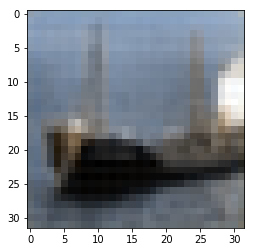

(3, 32, 32)


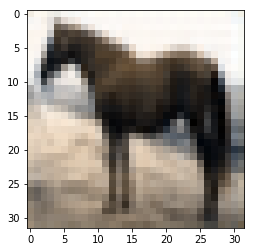

(3, 32, 32)


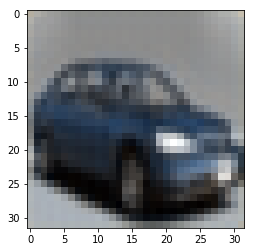

(3, 32, 32)


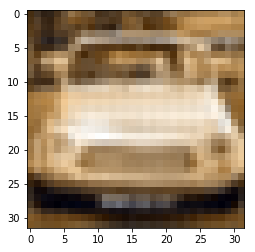

(3, 32, 32)


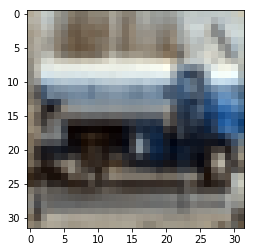

(3, 32, 32)


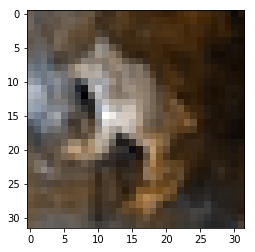

(3, 32, 32)


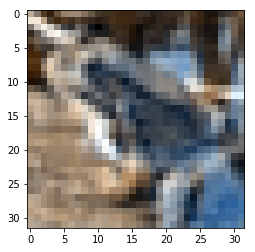

(3, 32, 32)


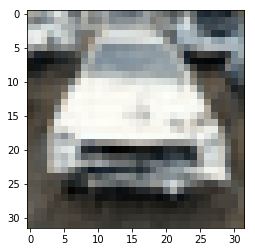

(3, 32, 32)


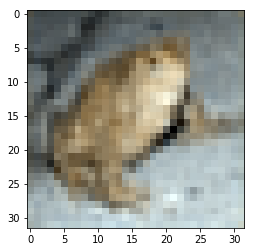

(3, 32, 32)


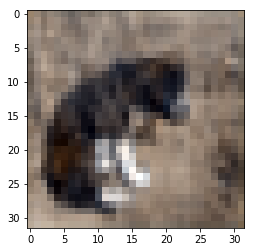

(3, 32, 32)


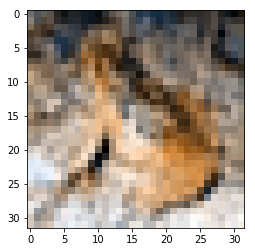

(3, 32, 32)


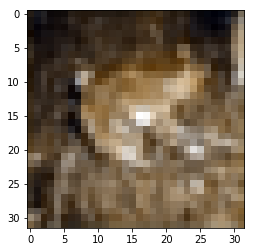

(3, 32, 32)


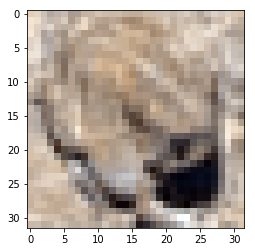

(3, 32, 32)


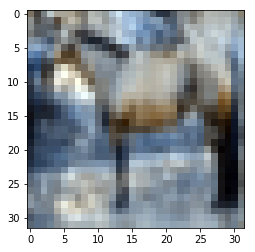

(3, 32, 32)


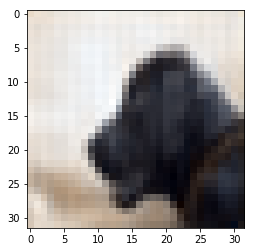

(3, 32, 32)


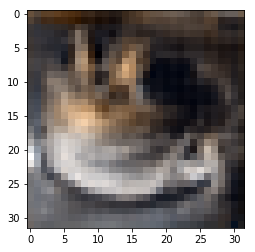

(3, 32, 32)


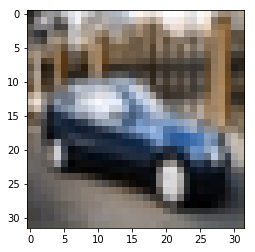

(3, 32, 32)


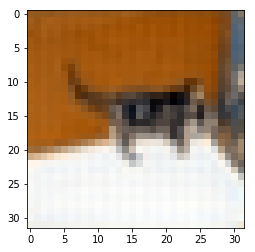

(3, 32, 32)


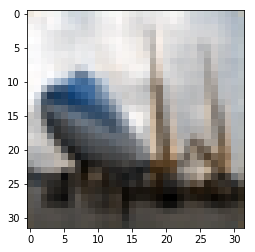

(3, 32, 32)


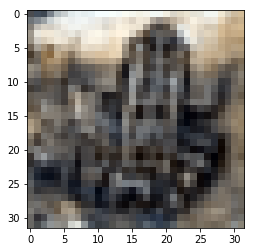

(3, 32, 32)


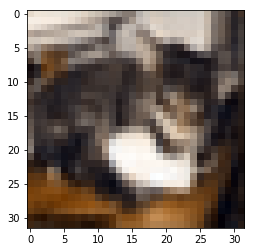

(3, 32, 32)


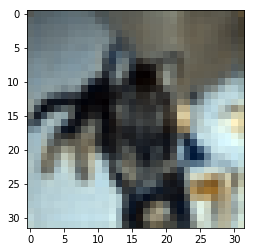

(3, 32, 32)


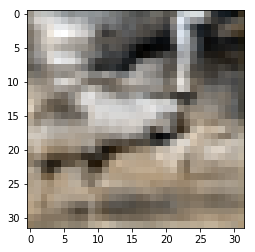

(3, 32, 32)


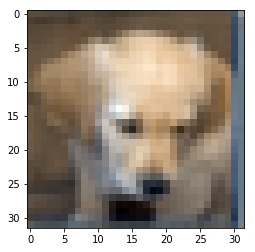

(3, 32, 32)


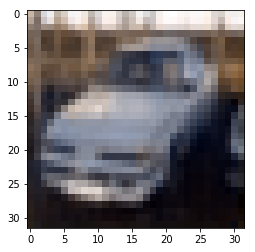

(3, 32, 32)


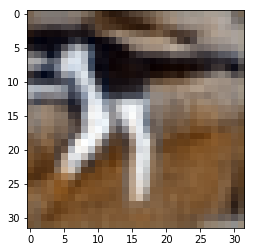

(3, 32, 32)


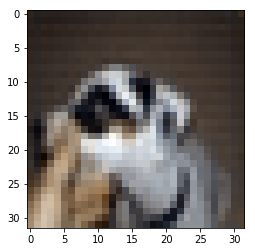

(3, 32, 32)


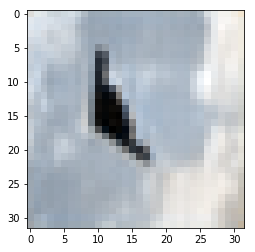

(3, 32, 32)


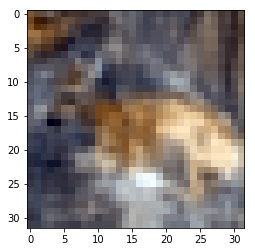

(3, 32, 32)


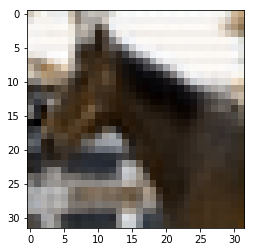

(3, 32, 32)


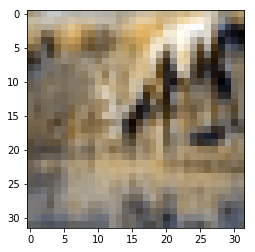

(3, 32, 32)


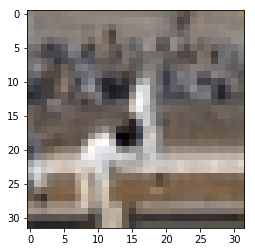

(3, 32, 32)


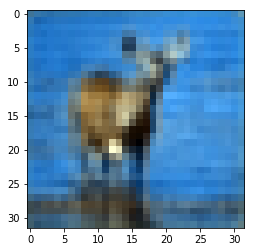

(3, 32, 32)


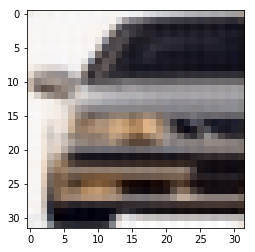

(3, 32, 32)


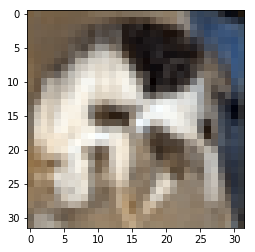

(3, 32, 32)


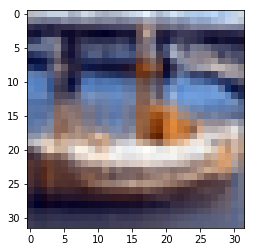

(3, 32, 32)


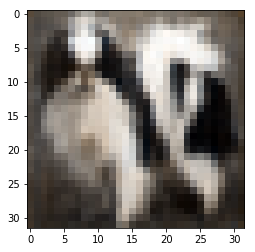

(3, 32, 32)


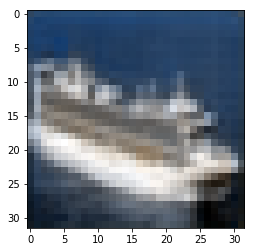

(3, 32, 32)


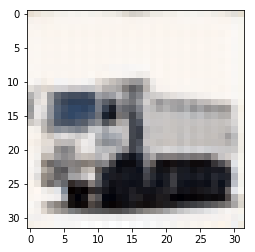

(3, 32, 32)


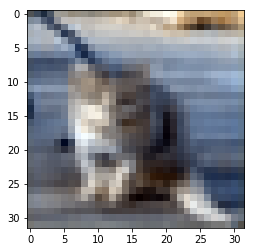

(3, 32, 32)


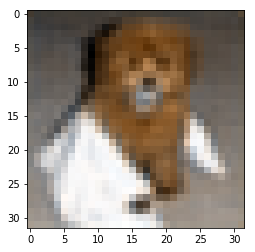

(3, 32, 32)


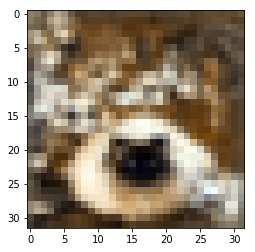

(3, 32, 32)


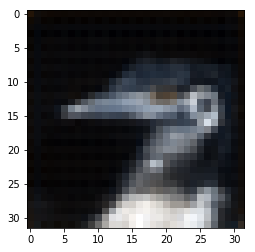

(3, 32, 32)


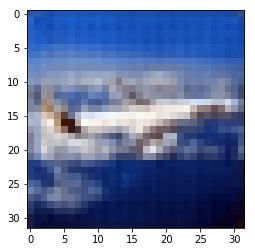

(3, 32, 32)


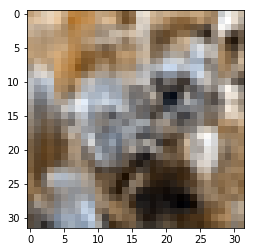

(3, 32, 32)


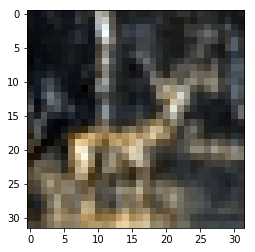

(3, 32, 32)


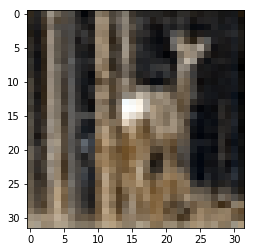

(3, 32, 32)


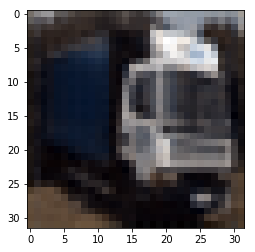

(3, 32, 32)


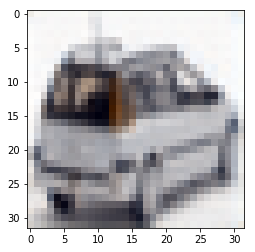

(3, 32, 32)


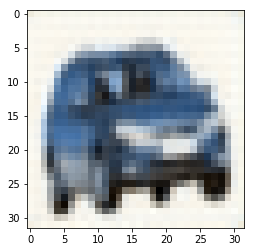

(3, 32, 32)


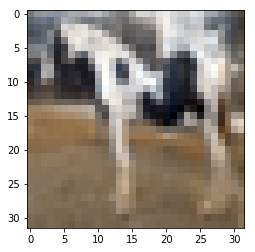

(3, 32, 32)


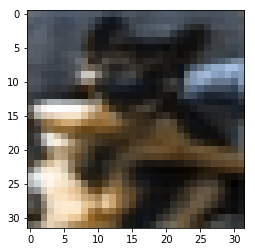

(3, 32, 32)


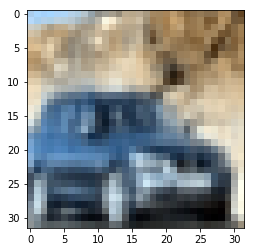

(3, 32, 32)


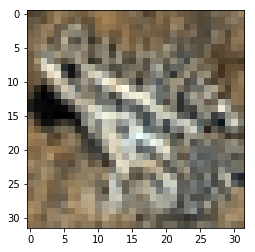

(3, 32, 32)


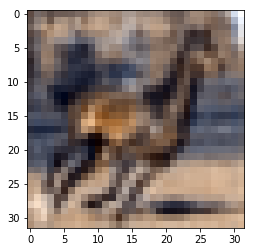

(3, 32, 32)


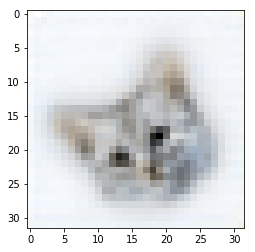

(3, 32, 32)


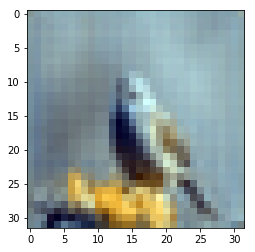

(3, 32, 32)


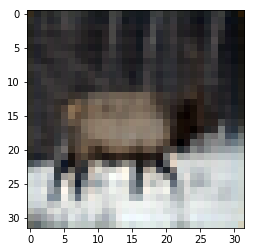

(3, 32, 32)


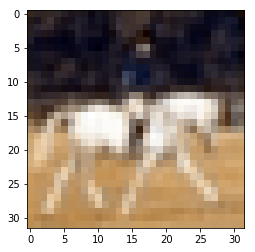

(3, 32, 32)


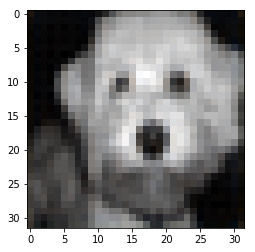

(3, 32, 32)


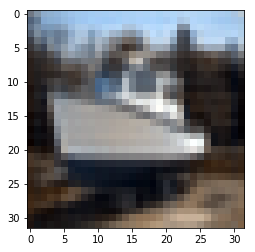

(3, 32, 32)


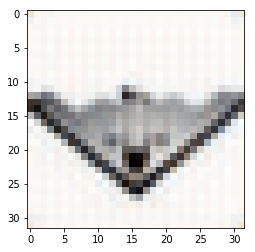

(3, 32, 32)


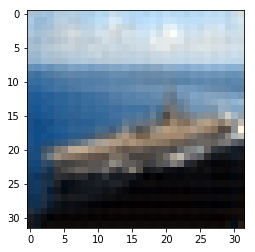

(3, 32, 32)


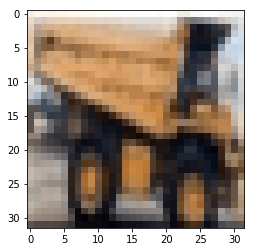

(3, 32, 32)


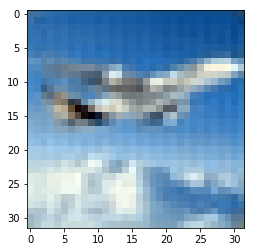

(3, 32, 32)


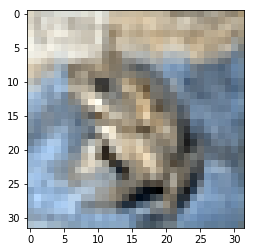

(3, 32, 32)


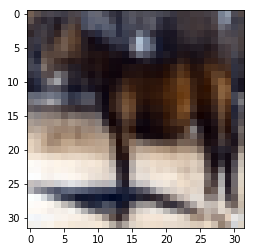

(3, 32, 32)


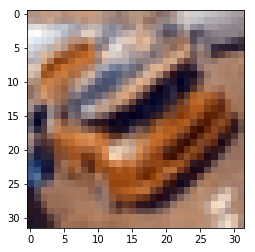

(3, 32, 32)


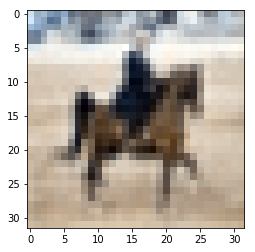

(3, 32, 32)


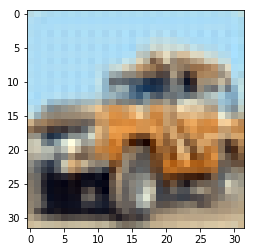

(3, 32, 32)


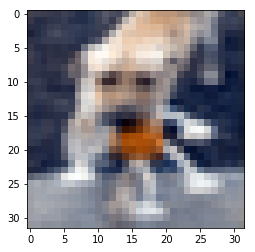

(3, 32, 32)


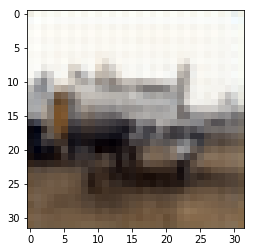

(3, 32, 32)


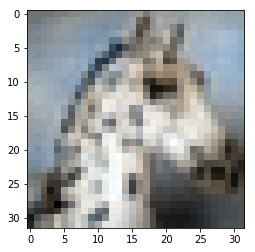

(3, 32, 32)


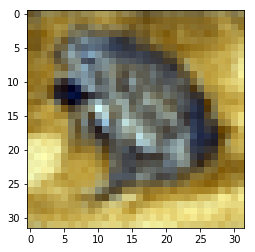

(3, 32, 32)


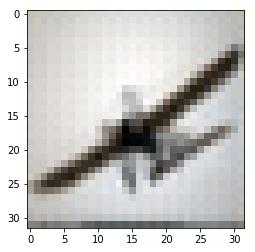

(3, 32, 32)


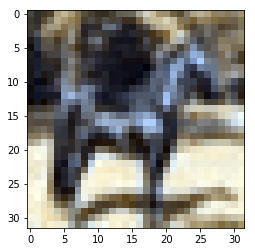

(3, 32, 32)


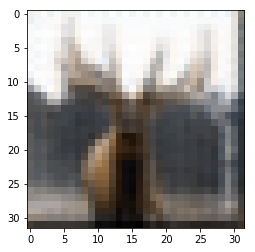

(3, 32, 32)


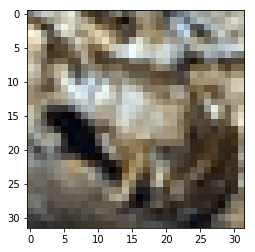

(3, 32, 32)


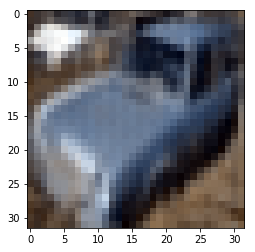

(3, 32, 32)


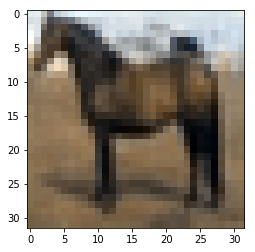

(3, 32, 32)


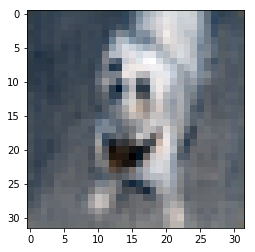

(3, 32, 32)


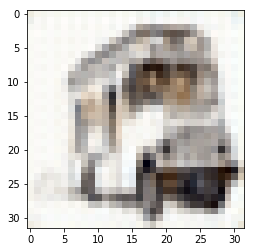

(3, 32, 32)


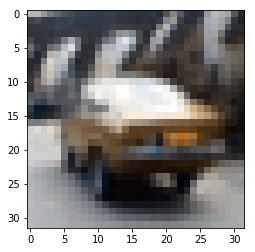

(3, 32, 32)


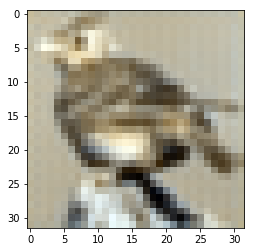

(3, 32, 32)


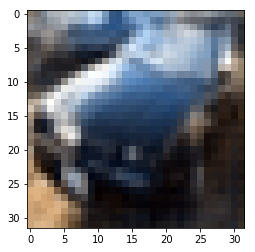

(3, 32, 32)


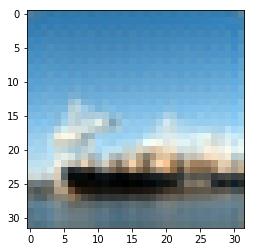

(3, 32, 32)


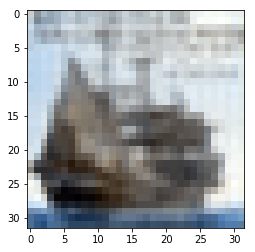

(3, 32, 32)


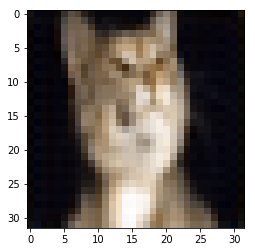

(3, 32, 32)


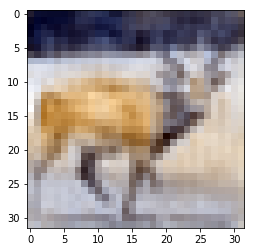

(3, 32, 32)


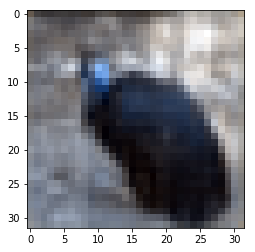

(3, 32, 32)


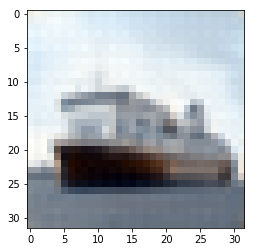

(3, 32, 32)


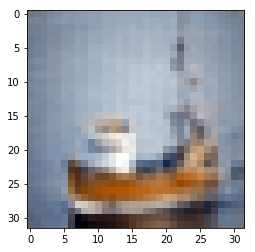

(3, 32, 32)


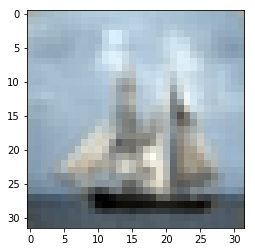

(3, 32, 32)


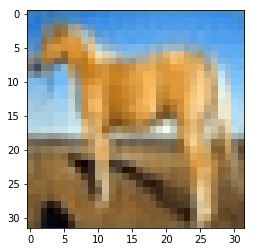

(3, 32, 32)


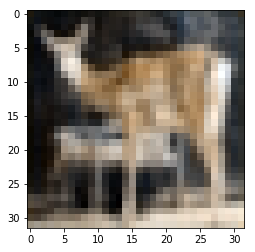

(3, 32, 32)


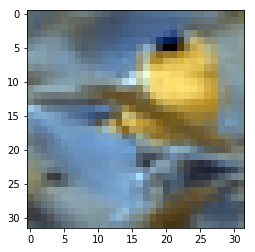

(3, 32, 32)


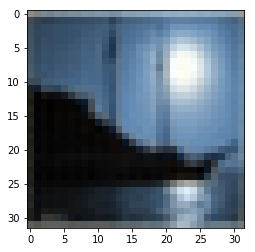

(3, 32, 32)


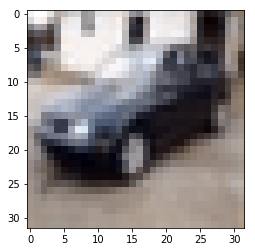

(3, 32, 32)


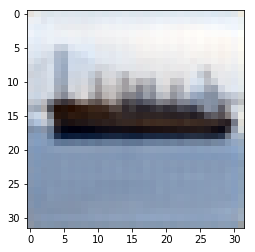

(3, 32, 32)


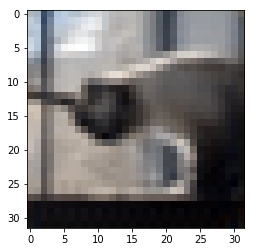

(3, 32, 32)


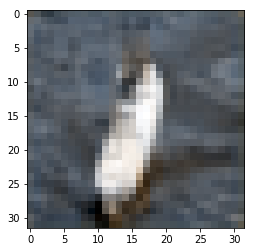

(3, 32, 32)


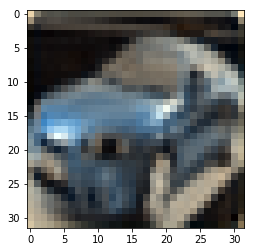

(3, 32, 32)


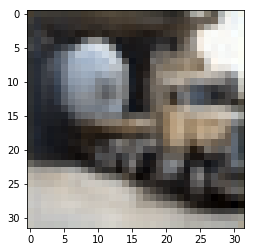

(3, 32, 32)


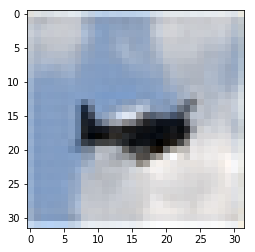

(3, 32, 32)


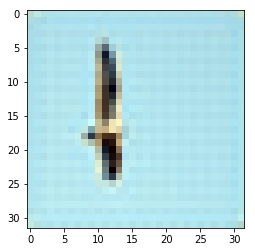

(3, 32, 32)


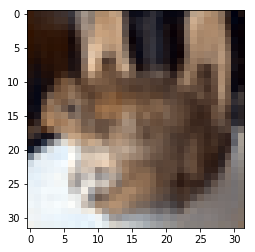

(3, 32, 32)


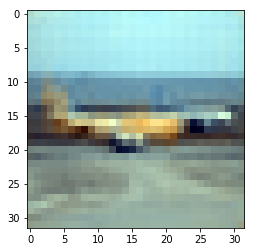

(3, 32, 32)


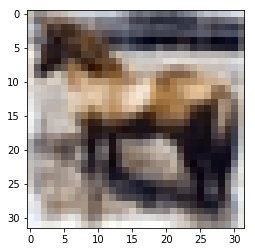

(3, 32, 32)


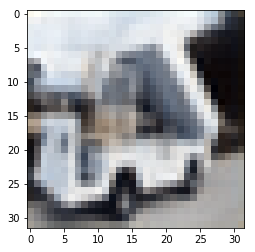

(3, 32, 32)


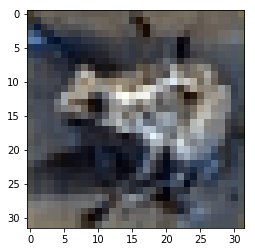

(3, 32, 32)


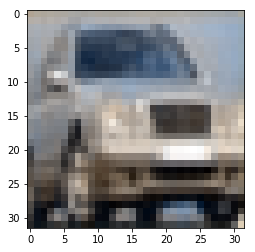

(3, 32, 32)


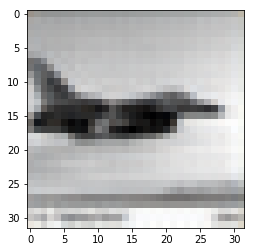

(3, 32, 32)


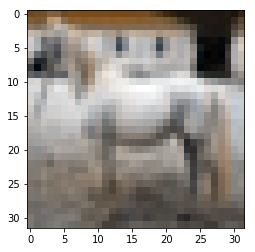

(3, 32, 32)


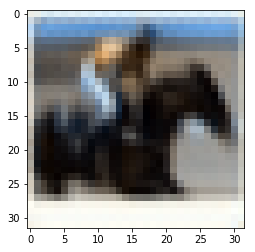

(3, 32, 32)


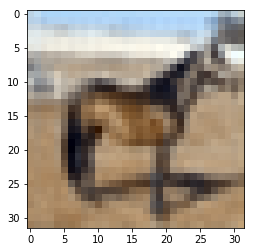

(3, 32, 32)


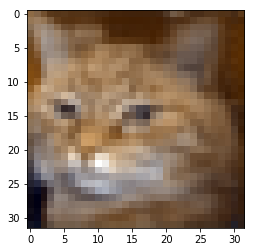

(3, 32, 32)


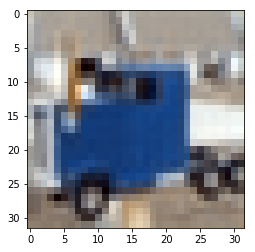

(3, 32, 32)


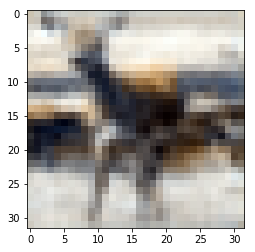

(3, 32, 32)


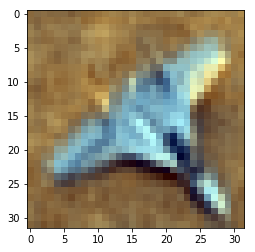

(3, 32, 32)


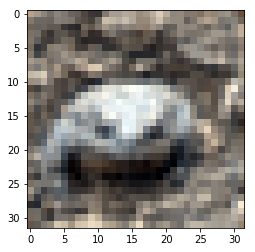

(3, 32, 32)


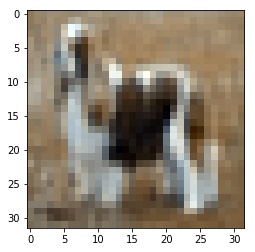

(3, 32, 32)


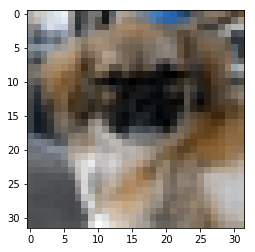

(3, 32, 32)


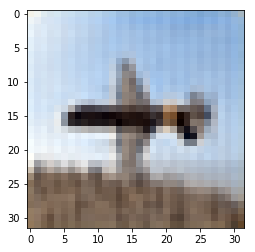

(3, 32, 32)


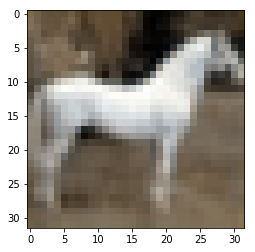

(3, 32, 32)


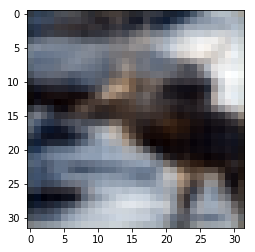

(3, 32, 32)


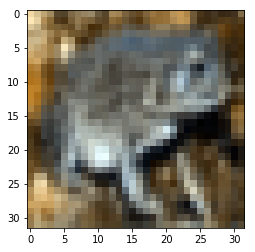

(3, 32, 32)


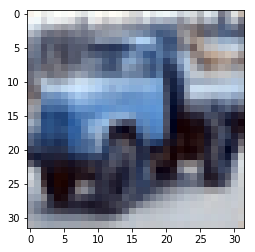

(3, 32, 32)


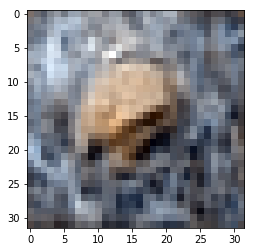

(3, 32, 32)


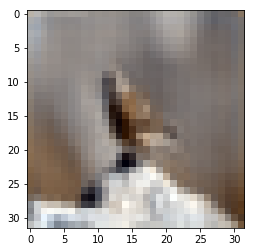

(3, 32, 32)


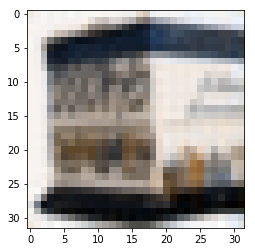

(3, 32, 32)


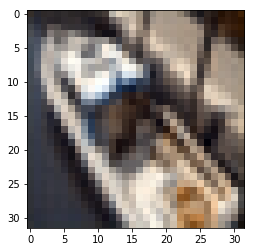

(3, 32, 32)


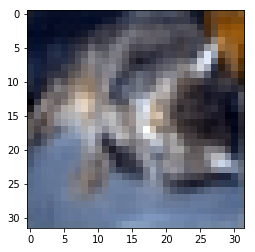

(3, 32, 32)


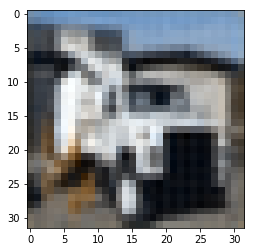

(3, 32, 32)


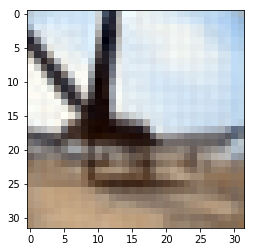

(3, 32, 32)


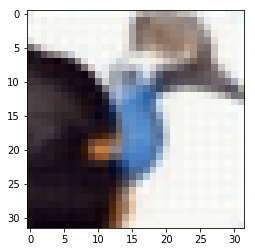

(3, 32, 32)


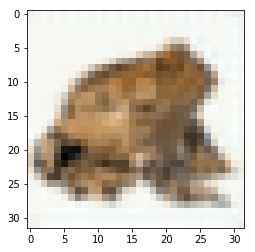

(3, 32, 32)


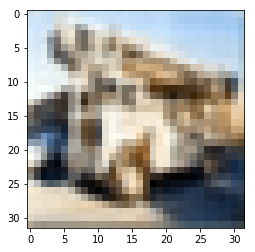

(3, 32, 32)


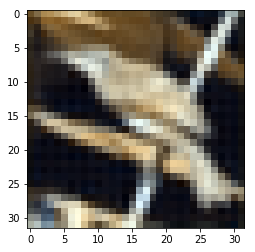

(3, 32, 32)


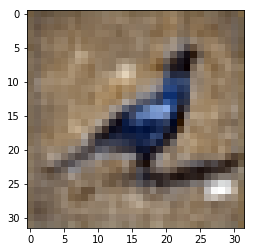

(3, 32, 32)


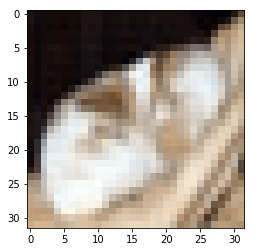

(3, 32, 32)


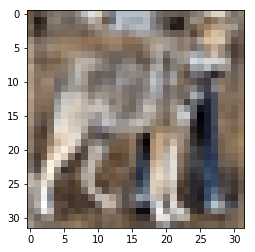

(3, 32, 32)


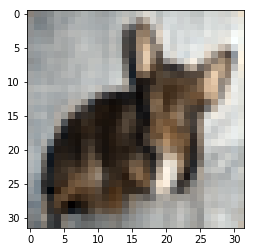

(3, 32, 32)


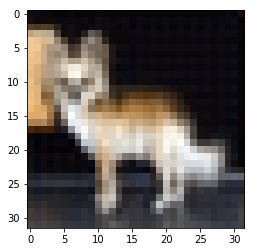

(3, 32, 32)


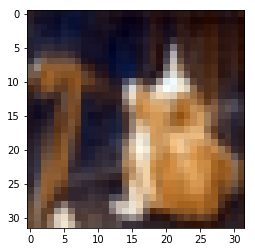

(3, 32, 32)


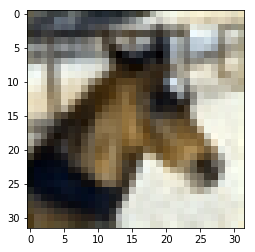

(3, 32, 32)


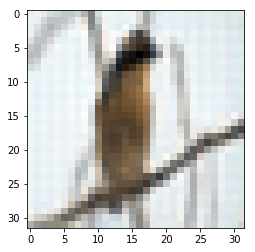

(3, 32, 32)


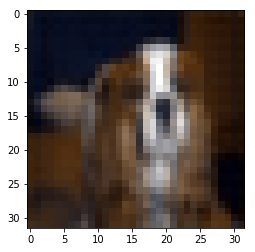

(3, 32, 32)


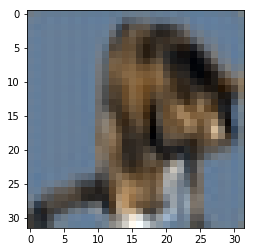

(3, 32, 32)


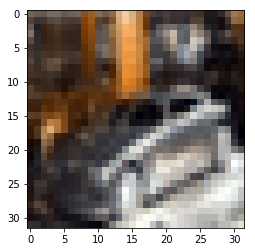

(3, 32, 32)


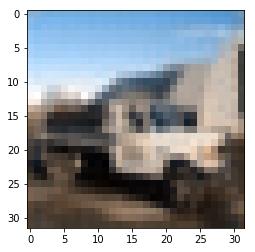

(3, 32, 32)


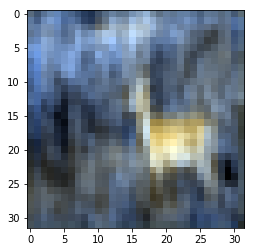

(3, 32, 32)


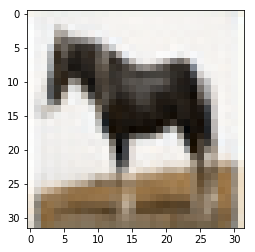

(3, 32, 32)


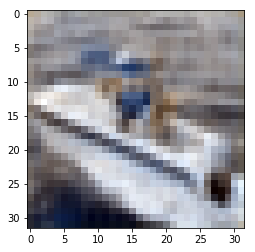

(3, 32, 32)


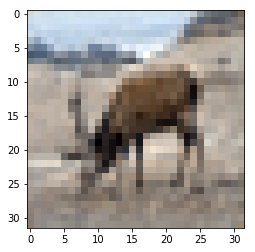

(3, 32, 32)


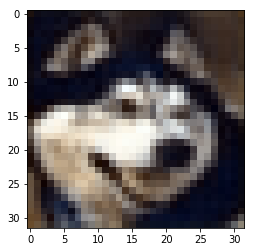

(3, 32, 32)


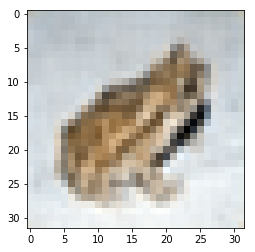

(3, 32, 32)


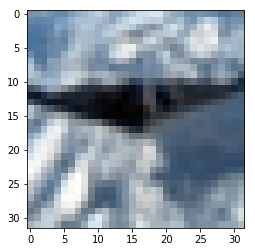

(3, 32, 32)


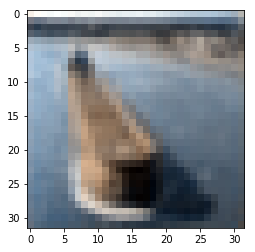

(3, 32, 32)


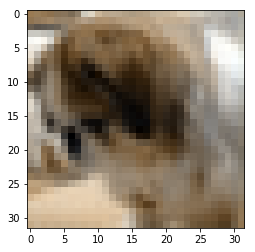

(3, 32, 32)


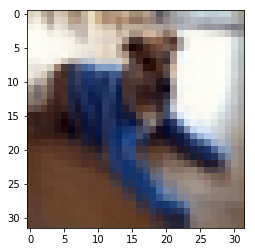

(3, 32, 32)


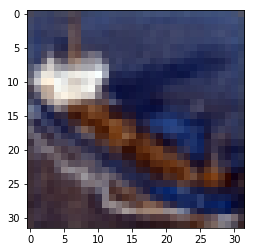

(3, 32, 32)


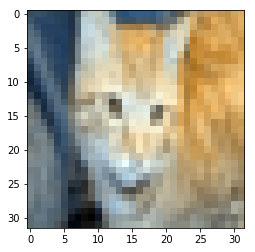

(3, 32, 32)


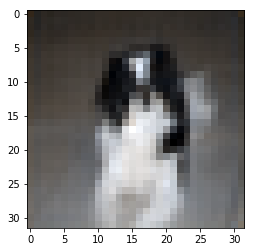

(3, 32, 32)


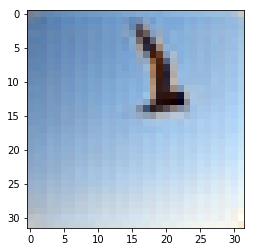

(3, 32, 32)


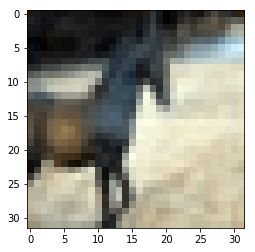

(3, 32, 32)


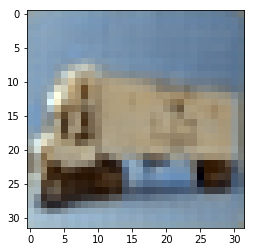

(3, 32, 32)


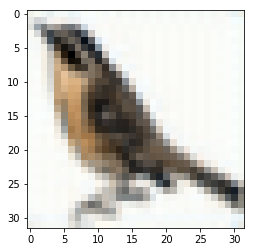

(3, 32, 32)


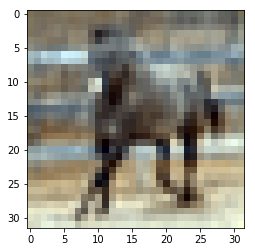

(3, 32, 32)


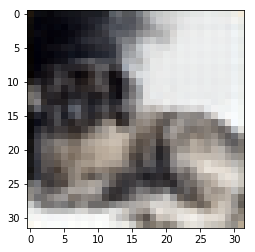

(3, 32, 32)


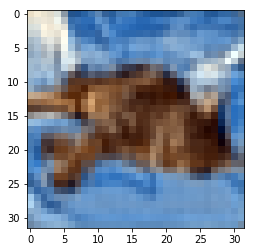

(3, 32, 32)


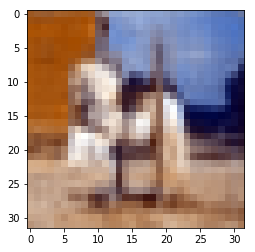

(3, 32, 32)


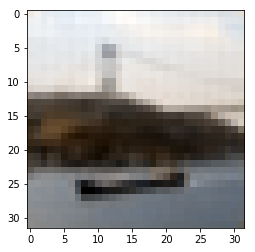

(3, 32, 32)


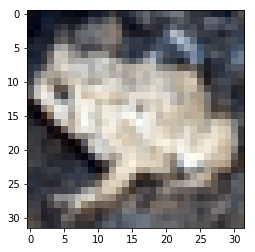

(3, 32, 32)


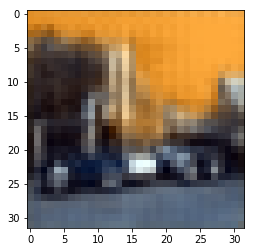

(3, 32, 32)


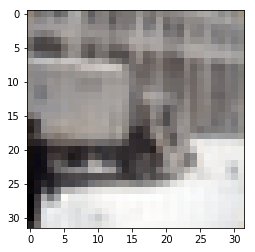

(3, 32, 32)


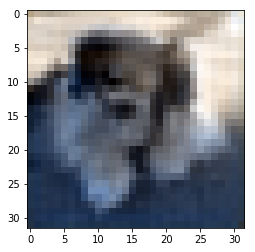

(3, 32, 32)


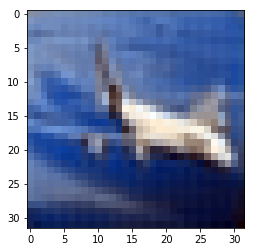

(3, 32, 32)


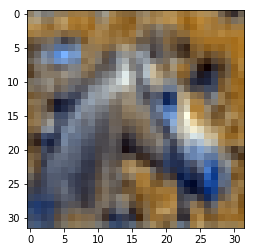

(3, 32, 32)


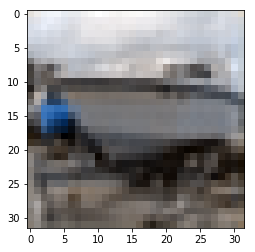

(3, 32, 32)


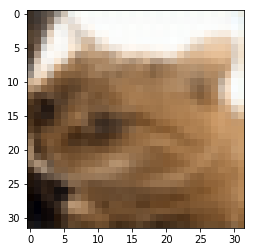

(3, 32, 32)


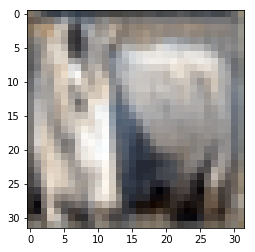

(3, 32, 32)


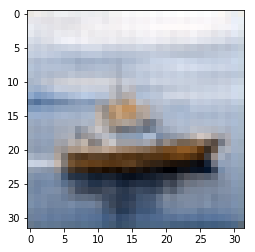

(3, 32, 32)


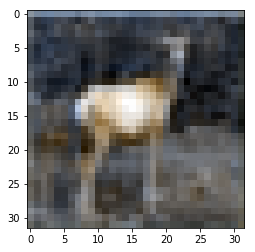

(3, 32, 32)


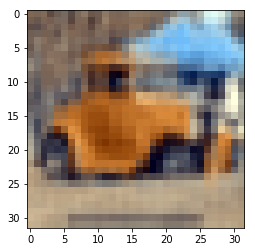

(3, 32, 32)


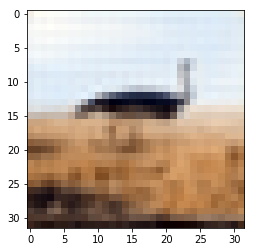

(3, 32, 32)


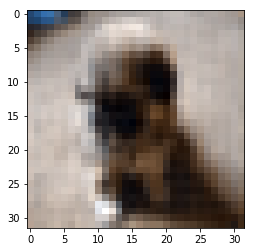

(3, 32, 32)


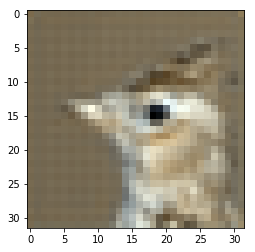

(3, 32, 32)


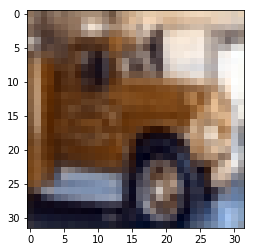

(3, 32, 32)


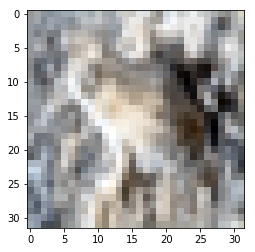

(3, 32, 32)


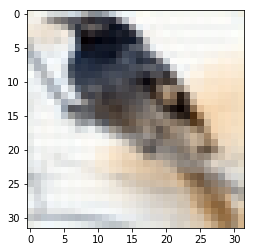

(3, 32, 32)


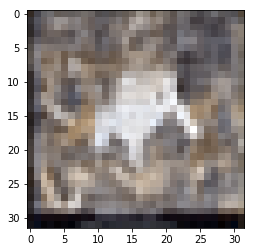

(3, 32, 32)


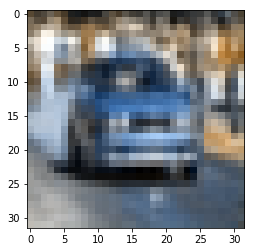

(3, 32, 32)


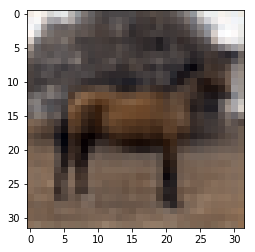

(3, 32, 32)


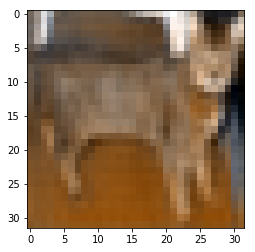

(3, 32, 32)


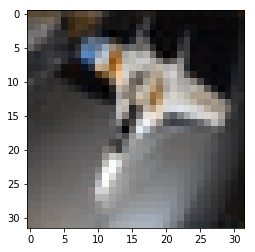

(3, 32, 32)


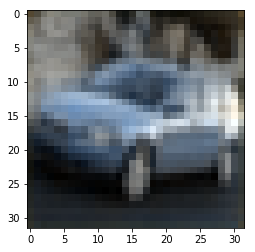

(3, 32, 32)


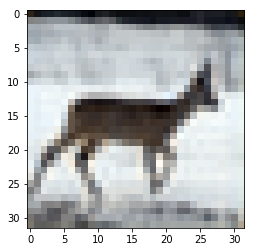

(3, 32, 32)


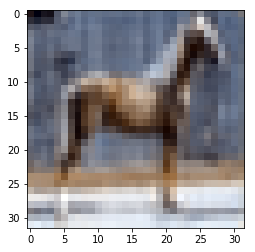

(3, 32, 32)


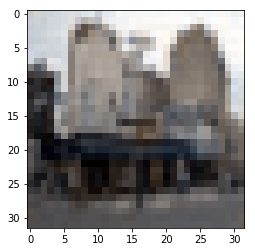

(3, 32, 32)


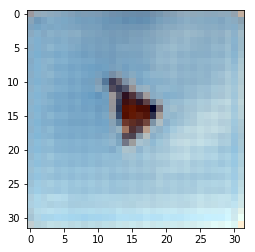

(3, 32, 32)


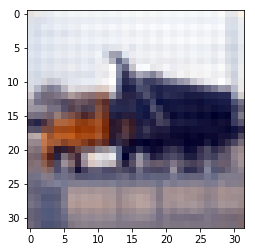

(3, 32, 32)


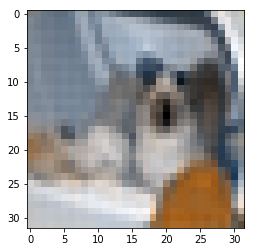

(3, 32, 32)


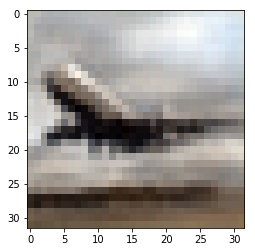

(3, 32, 32)


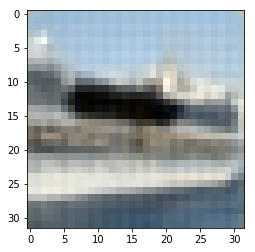

(3, 32, 32)


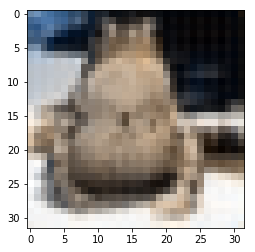

(3, 32, 32)


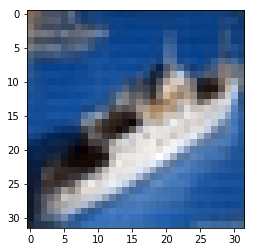

(3, 32, 32)


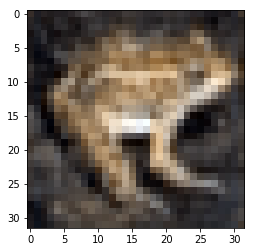

(3, 32, 32)


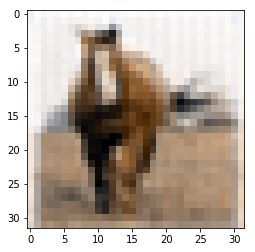

(3, 32, 32)


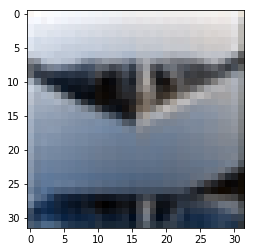

(3, 32, 32)


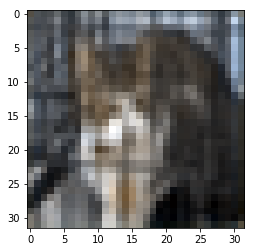

(3, 32, 32)


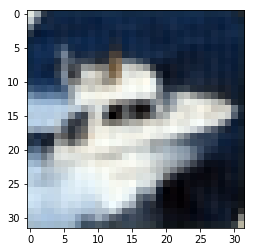

(3, 32, 32)


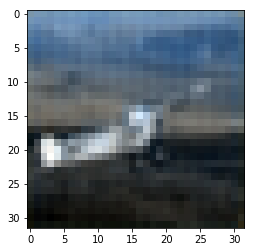

(3, 32, 32)


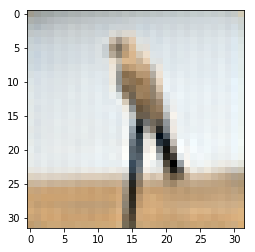

(3, 32, 32)


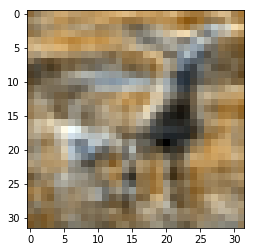

(3, 32, 32)


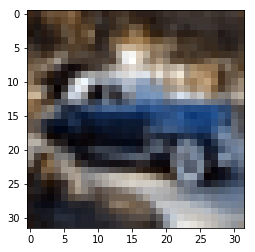

(3, 32, 32)


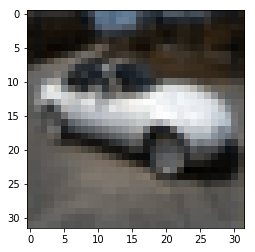

(3, 32, 32)


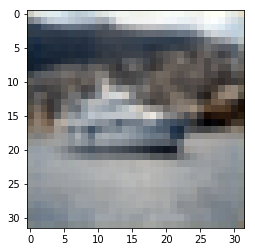

(3, 32, 32)


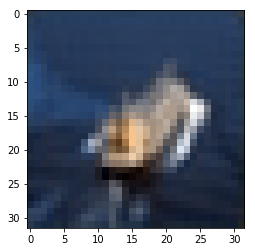

(3, 32, 32)


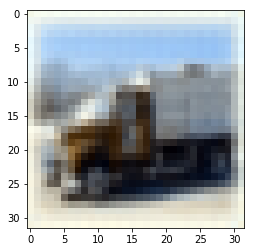

(3, 32, 32)


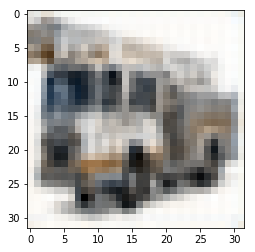

(3, 32, 32)


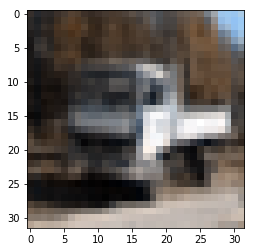

(3, 32, 32)


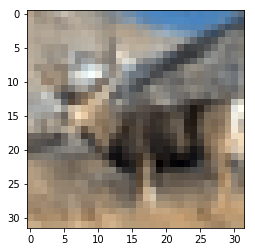

(3, 32, 32)


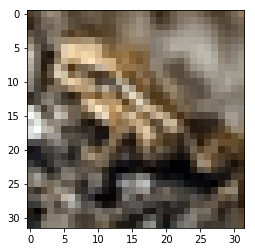

(3, 32, 32)


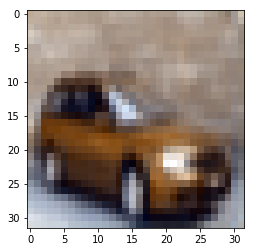

(3, 32, 32)


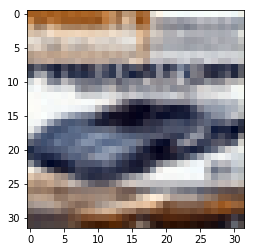

(3, 32, 32)


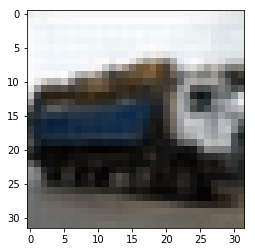

(3, 32, 32)


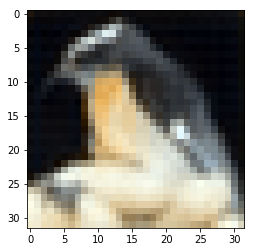

(3, 32, 32)


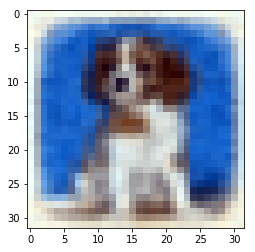

(3, 32, 32)


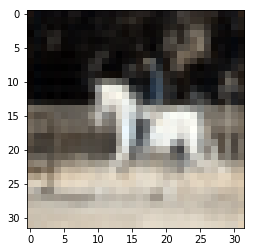

(3, 32, 32)


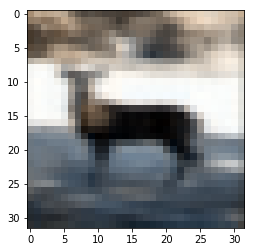

(3, 32, 32)


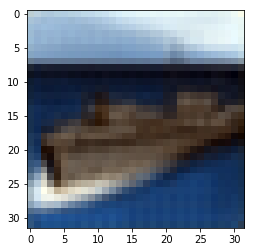

(3, 32, 32)


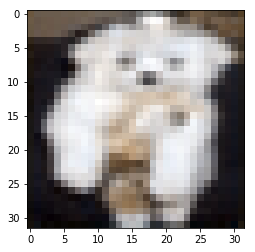

(3, 32, 32)


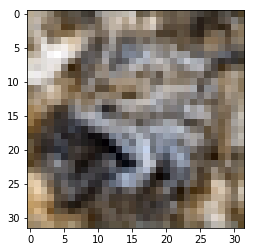

(3, 32, 32)


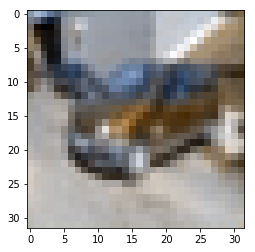

(3, 32, 32)


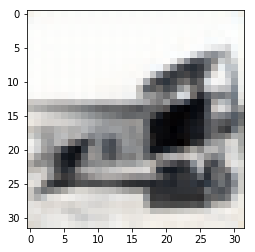

(3, 32, 32)


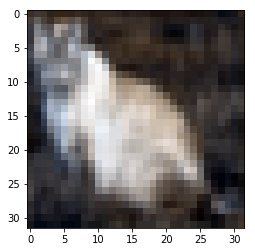

(3, 32, 32)


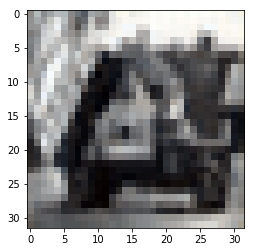

(3, 32, 32)


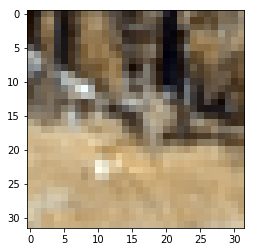

(3, 32, 32)


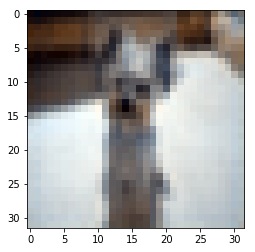

(3, 32, 32)


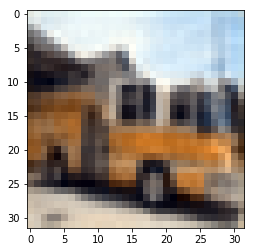

(3, 32, 32)


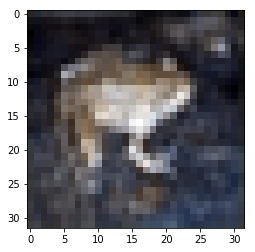

(3, 32, 32)


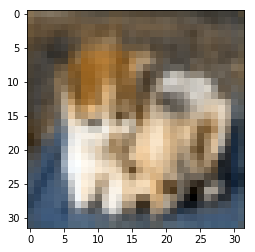

(3, 32, 32)


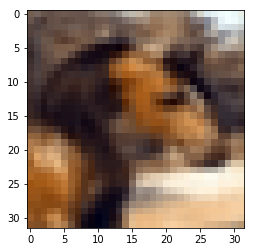

(3, 32, 32)


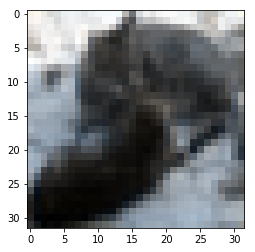

(3, 32, 32)


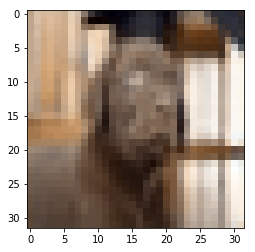

(3, 32, 32)


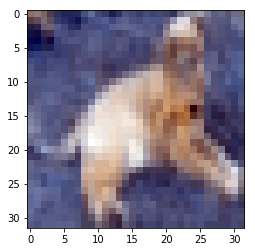

(3, 32, 32)


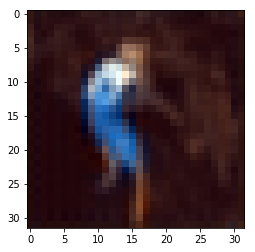

(3, 32, 32)


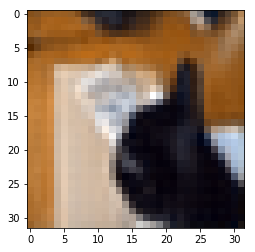

(3, 32, 32)


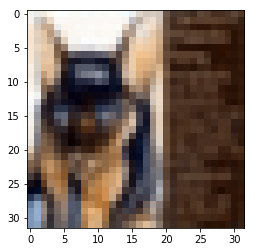

(3, 32, 32)


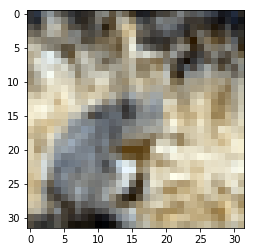

(3, 32, 32)


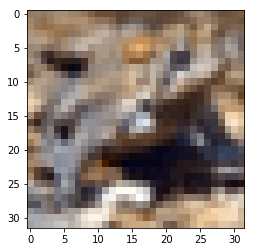

(3, 32, 32)


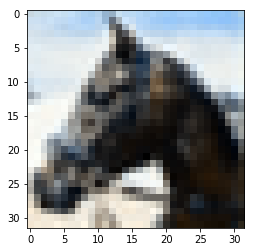

(3, 32, 32)


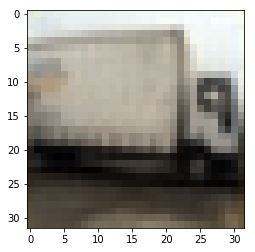

(3, 32, 32)


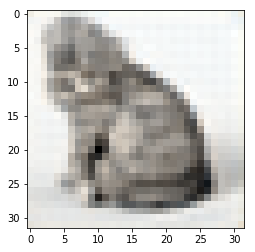

(3, 32, 32)


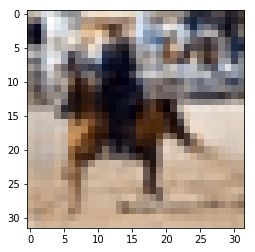

(3, 32, 32)


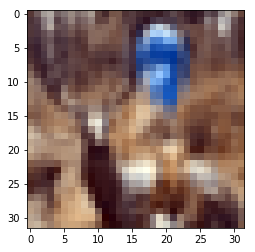

(3, 32, 32)


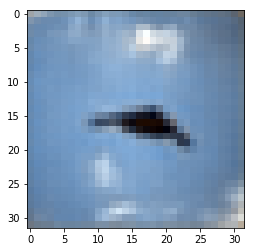

(3, 32, 32)


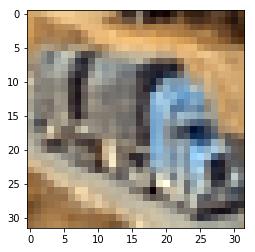

(3, 32, 32)


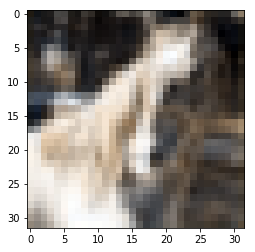

(3, 32, 32)


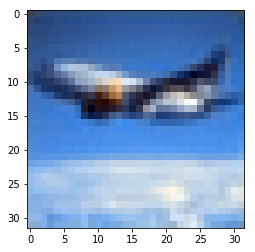

(3, 32, 32)


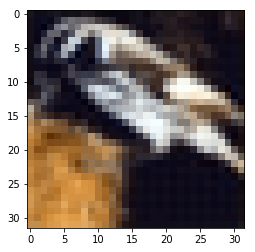

(3, 32, 32)


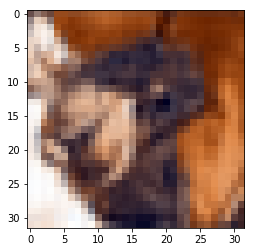

(3, 32, 32)


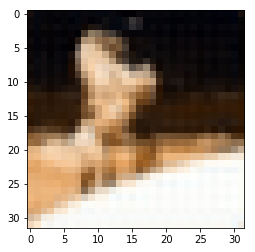

(3, 32, 32)


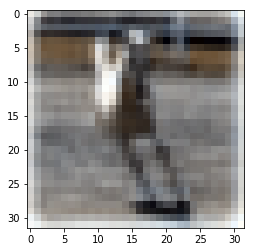

(3, 32, 32)


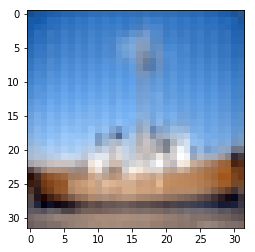

(3, 32, 32)


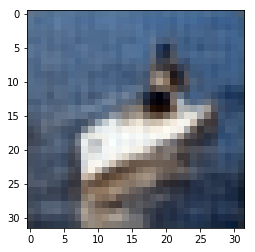

(3, 32, 32)


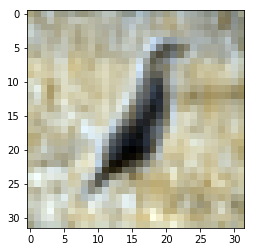

(3, 32, 32)


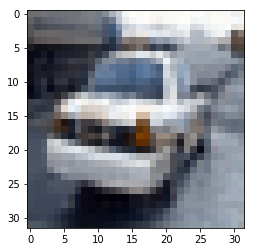

(3, 32, 32)


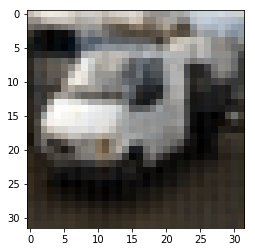

(3, 32, 32)


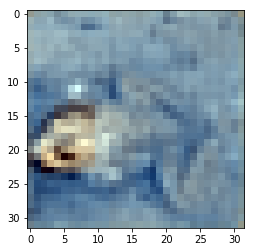

(3, 32, 32)


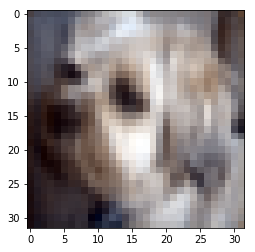

(3, 32, 32)


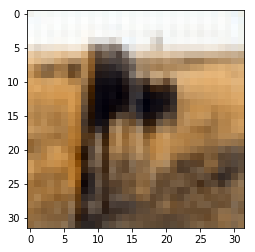

(3, 32, 32)


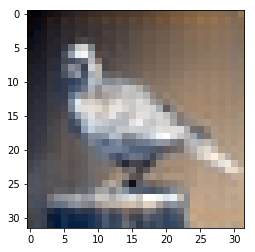

(3, 32, 32)


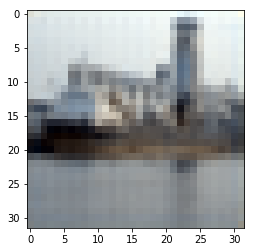

(3, 32, 32)


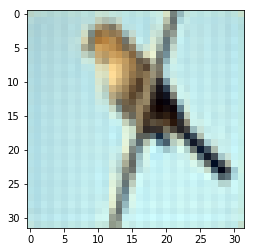

(3, 32, 32)


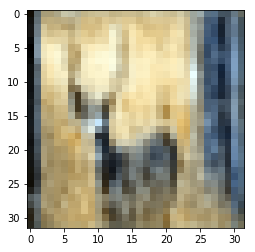

(3, 32, 32)


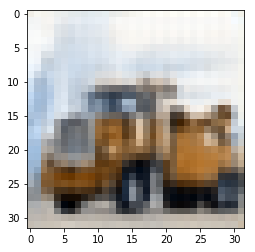

(3, 32, 32)


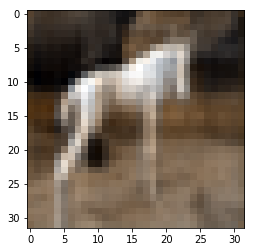

(3, 32, 32)


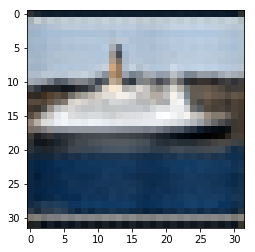

(3, 32, 32)


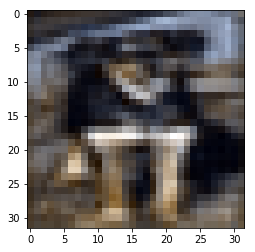

(3, 32, 32)


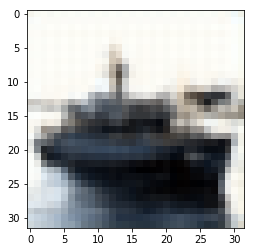

(3, 32, 32)


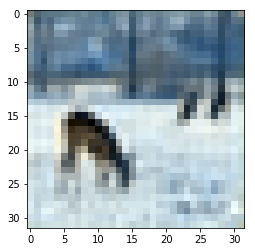

(3, 32, 32)


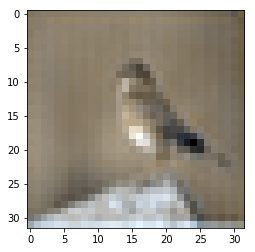

(3, 32, 32)


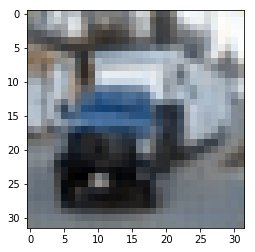

(3, 32, 32)


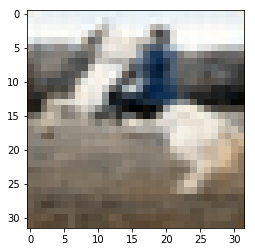

(3, 32, 32)


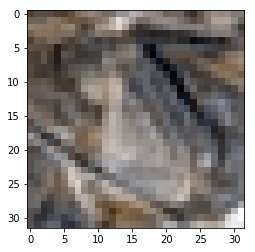

(3, 32, 32)


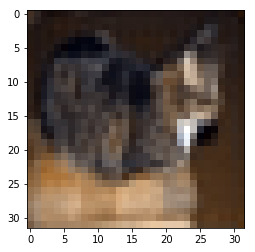

(3, 32, 32)


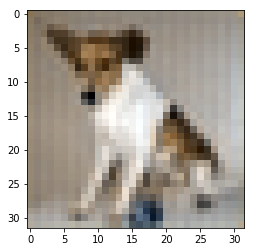

(3, 32, 32)


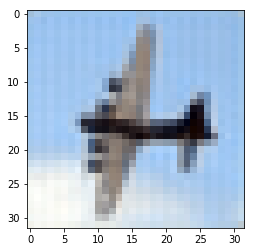

(3, 32, 32)


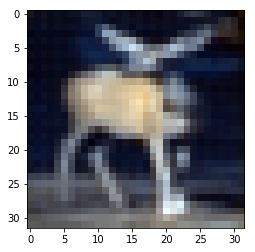

(3, 32, 32)


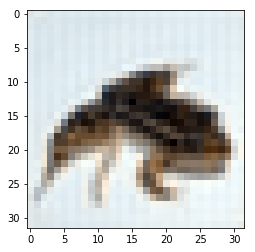

(3, 32, 32)


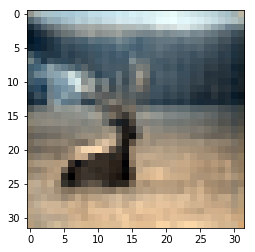

(3, 32, 32)


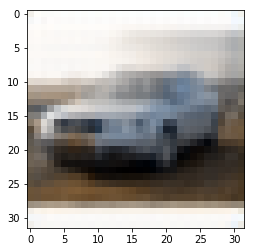

(3, 32, 32)


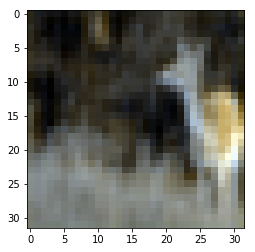

(3, 32, 32)


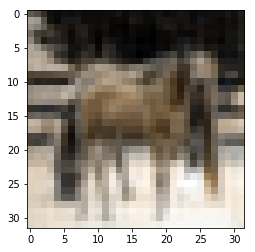

(3, 32, 32)


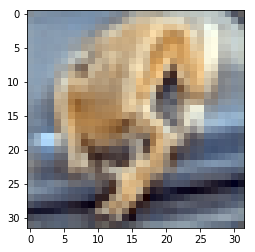

(3, 32, 32)


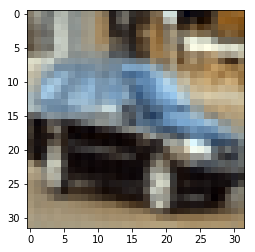

(3, 32, 32)


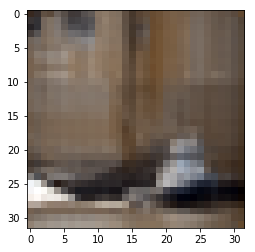

(3, 32, 32)


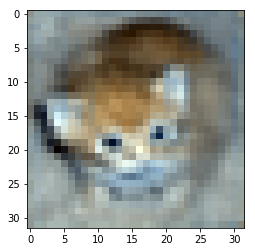

(3, 32, 32)


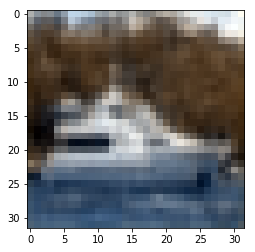

(3, 32, 32)


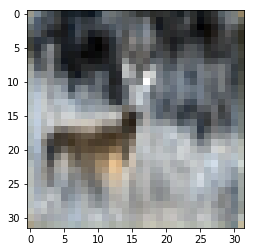

(3, 32, 32)


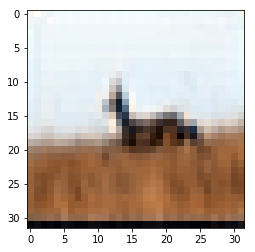

(3, 32, 32)


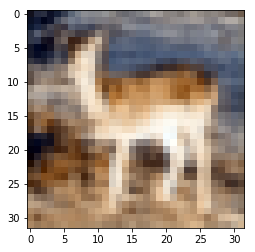

(3, 32, 32)


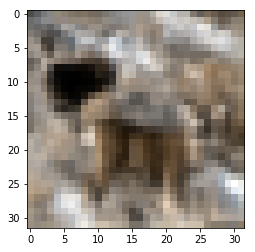

(3, 32, 32)


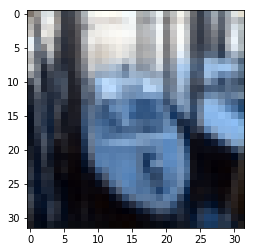

(3, 32, 32)


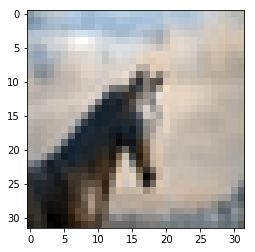

(3, 32, 32)


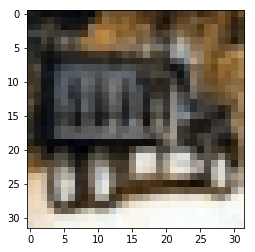

(3, 32, 32)


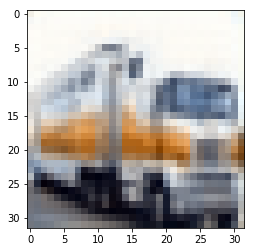

(3, 32, 32)


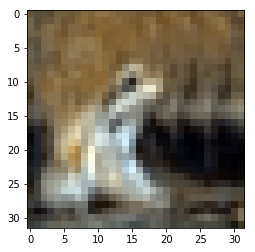

(3, 32, 32)


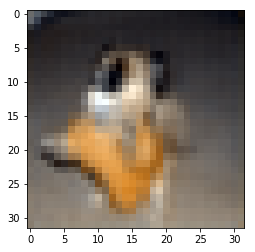

(3, 32, 32)


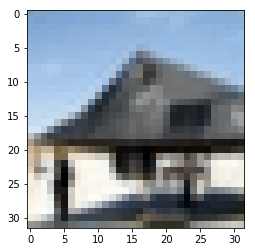

(3, 32, 32)


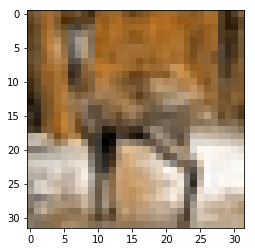

(3, 32, 32)


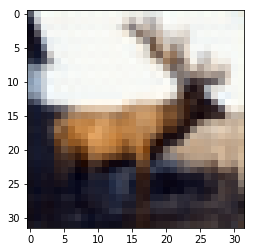

(3, 32, 32)


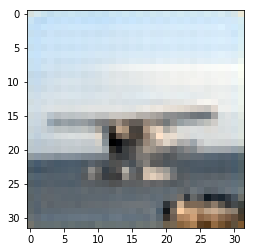

(3, 32, 32)


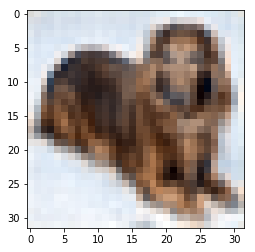

(3, 32, 32)


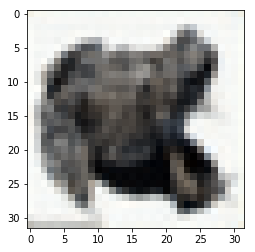

(3, 32, 32)


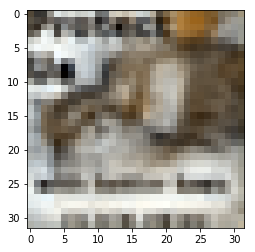

(3, 32, 32)


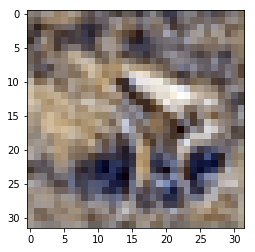

(3, 32, 32)


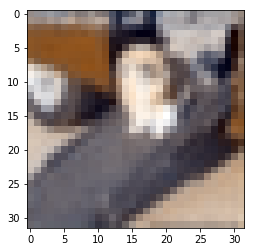

(3, 32, 32)


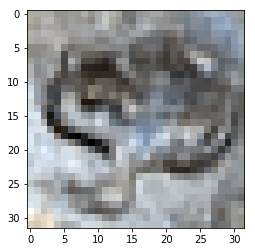

(3, 32, 32)


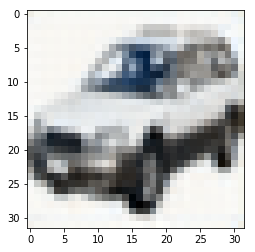

(3, 32, 32)


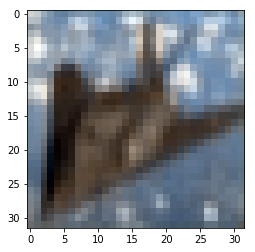

(3, 32, 32)


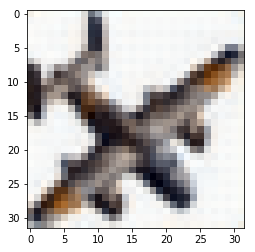

(3, 32, 32)


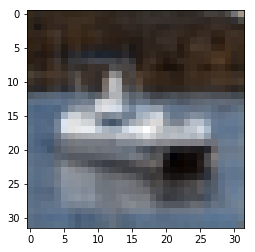

(3, 32, 32)


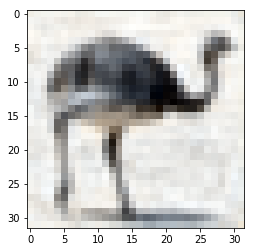

(3, 32, 32)


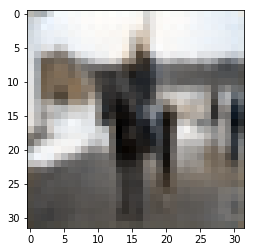

(3, 32, 32)


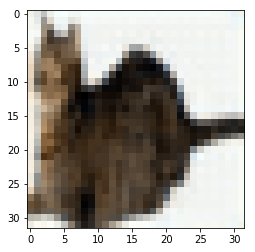

(3, 32, 32)


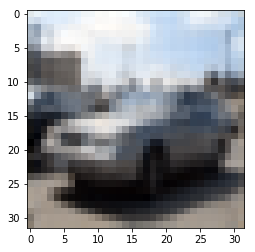

(3, 32, 32)


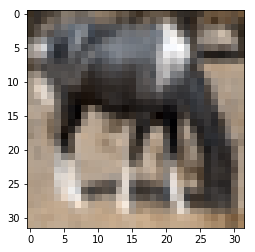

(3, 32, 32)


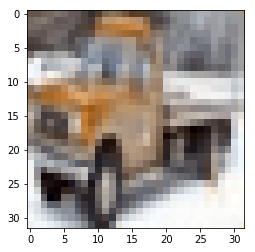

(3, 32, 32)


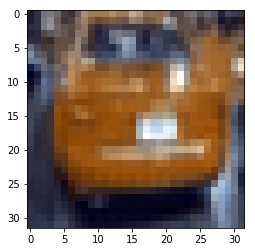

(3, 32, 32)


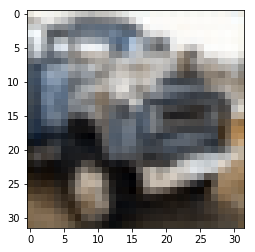

(3, 32, 32)


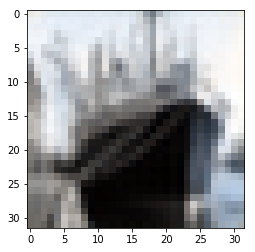

(3, 32, 32)


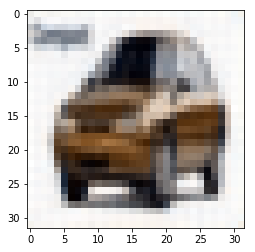

(3, 32, 32)


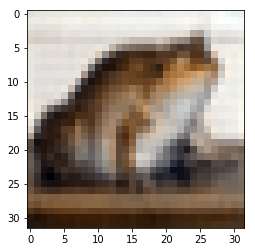

(3, 32, 32)


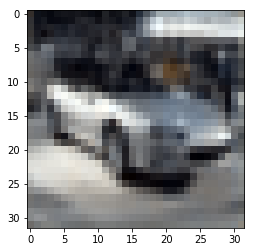

(3, 32, 32)


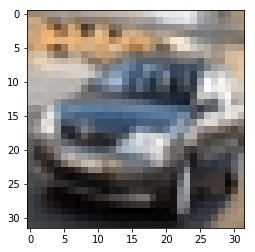

(3, 32, 32)


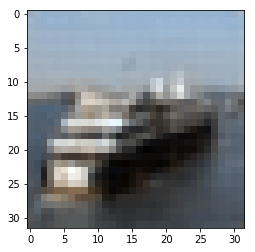

(3, 32, 32)


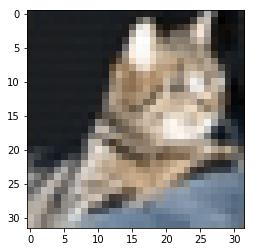

(3, 32, 32)


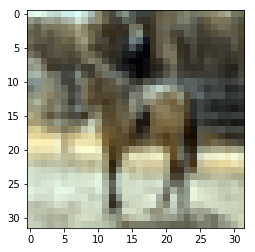

(3, 32, 32)


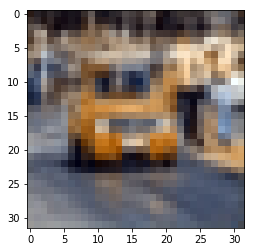

(3, 32, 32)


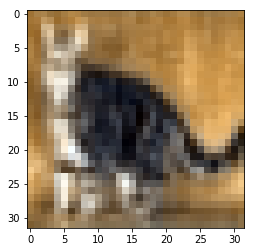

(3, 32, 32)


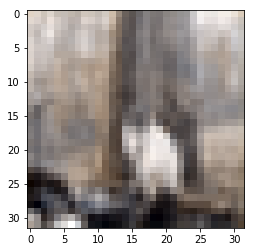

(3, 32, 32)


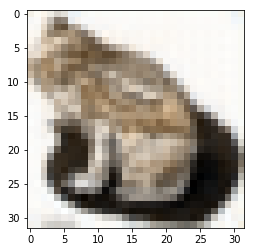

(3, 32, 32)


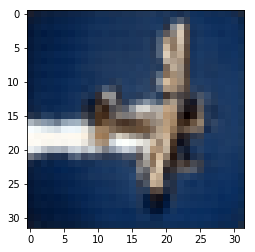

(3, 32, 32)


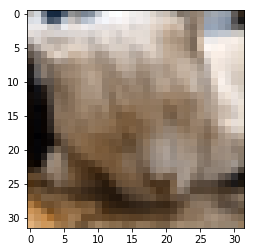

(3, 32, 32)


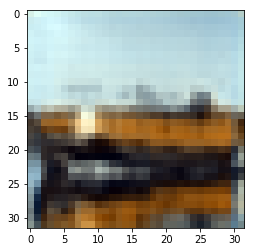

(3, 32, 32)


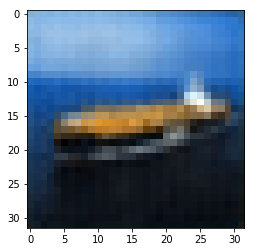

(3, 32, 32)


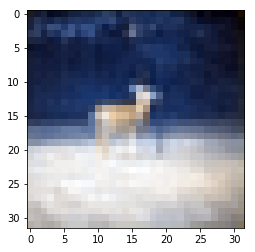

(3, 32, 32)


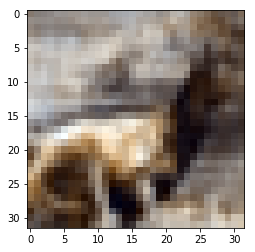

(3, 32, 32)


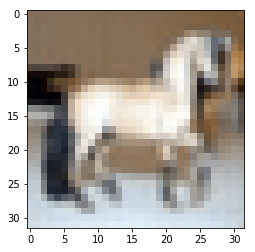

(3, 32, 32)


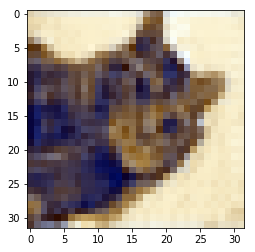

(3, 32, 32)


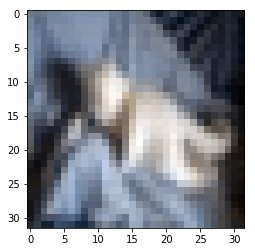

(3, 32, 32)


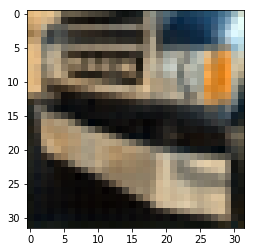

(3, 32, 32)


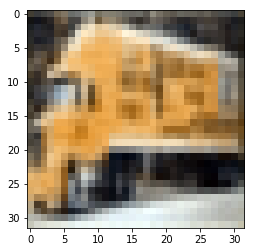

(3, 32, 32)


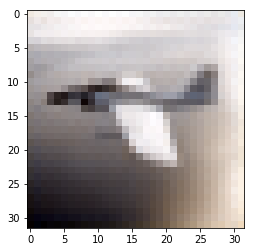

(3, 32, 32)


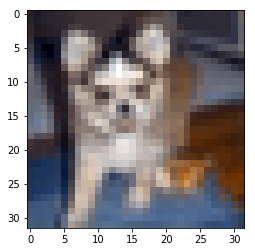

(3, 32, 32)


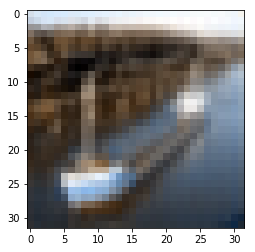

(3, 32, 32)


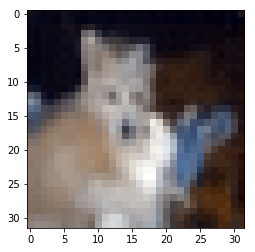

(3, 32, 32)


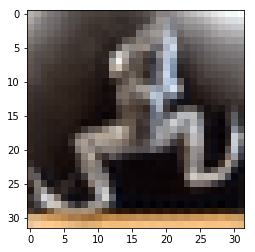

(3, 32, 32)


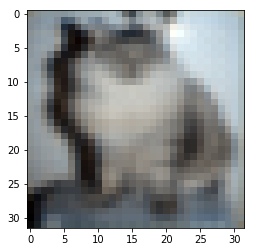

(3, 32, 32)


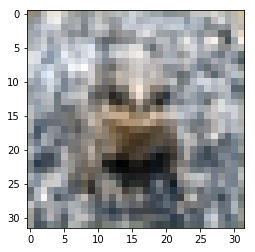

(3, 32, 32)


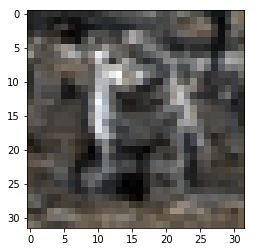

(3, 32, 32)


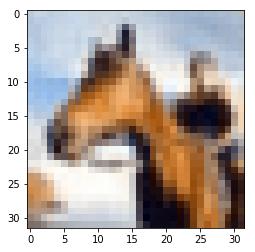

(3, 32, 32)


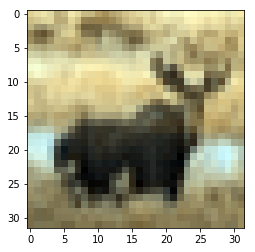

(3, 32, 32)


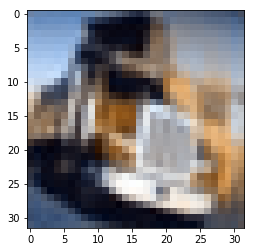

(3, 32, 32)


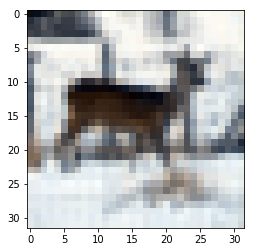

(3, 32, 32)


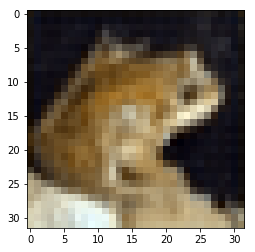

(3, 32, 32)


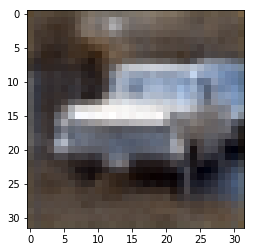

(3, 32, 32)


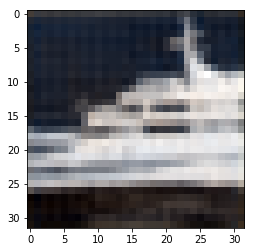

(3, 32, 32)


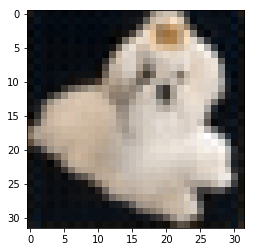

(3, 32, 32)


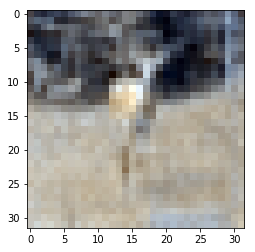

(3, 32, 32)


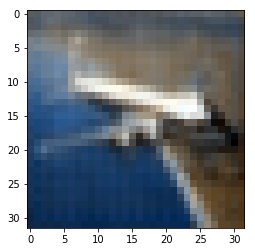

(3, 32, 32)


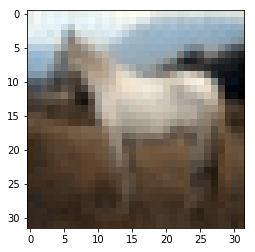

(3, 32, 32)


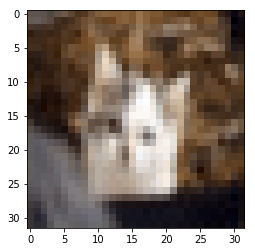

(3, 32, 32)


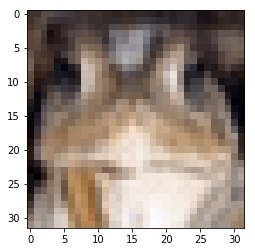

(3, 32, 32)


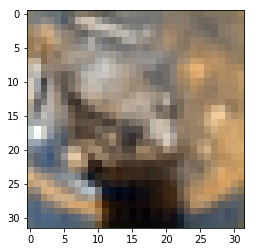

(3, 32, 32)


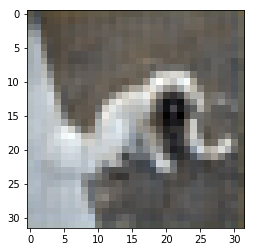

(3, 32, 32)


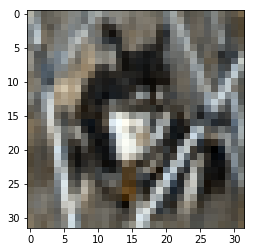

(3, 32, 32)


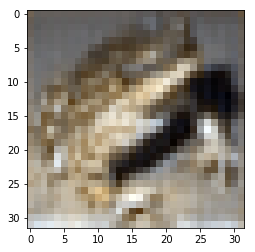

(3, 32, 32)


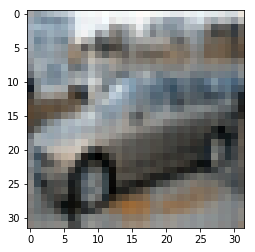

(3, 32, 32)


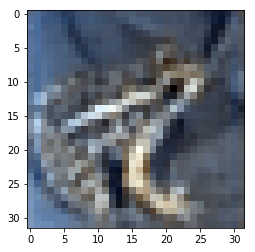

(3, 32, 32)


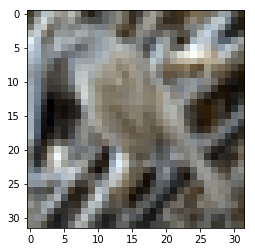

(3, 32, 32)


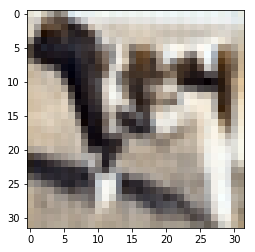

(3, 32, 32)


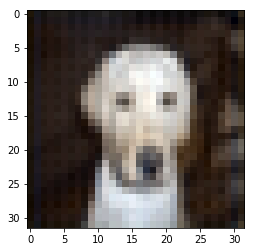

(3, 32, 32)


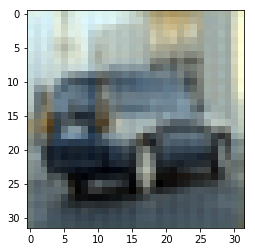

(3, 32, 32)


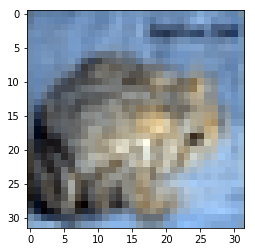

(3, 32, 32)


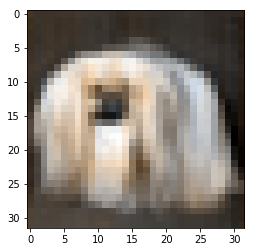

(3, 32, 32)


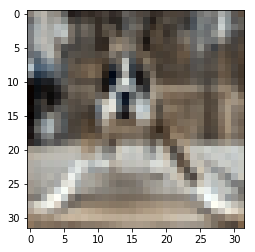

(3, 32, 32)


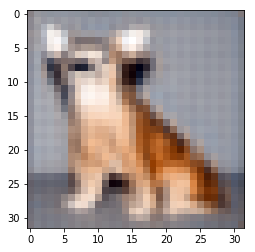

(3, 32, 32)


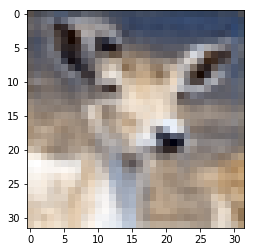

(3, 32, 32)


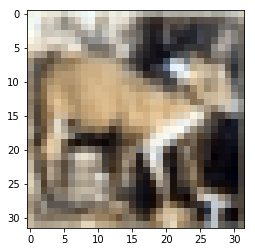

(3, 32, 32)


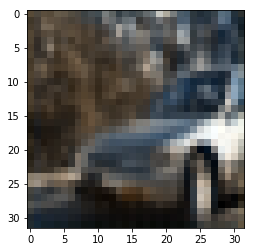

(3, 32, 32)


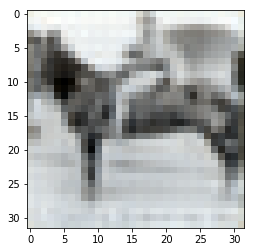

(3, 32, 32)


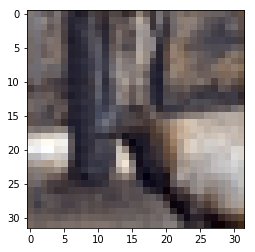

(3, 32, 32)


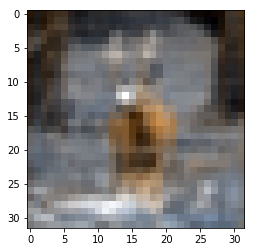

(3, 32, 32)


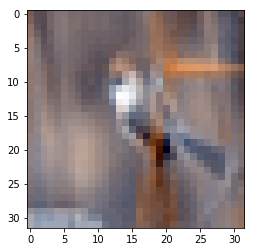

(3, 32, 32)


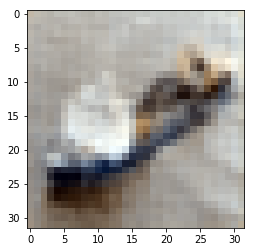

(3, 32, 32)


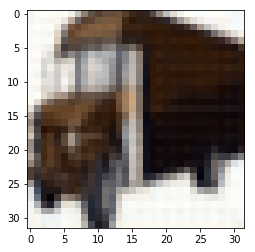

(3, 32, 32)


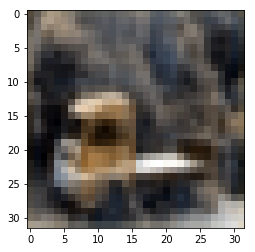

(3, 32, 32)


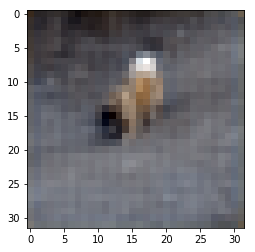

(3, 32, 32)


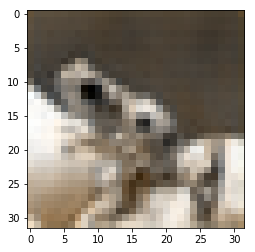

(3, 32, 32)


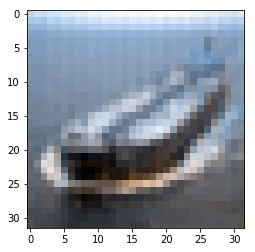

(3, 32, 32)


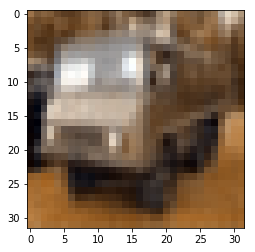

(3, 32, 32)


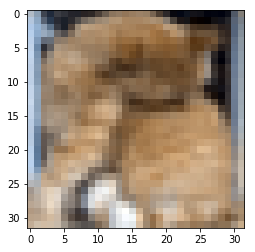

(3, 32, 32)


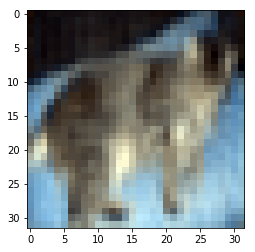

(3, 32, 32)


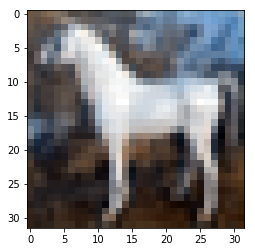

(3, 32, 32)


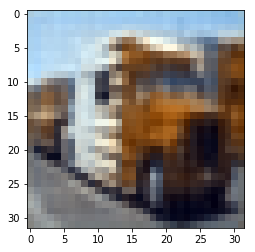

(3, 32, 32)


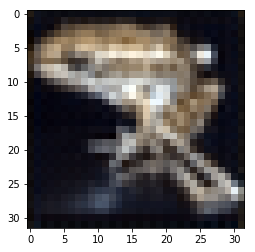

(3, 32, 32)


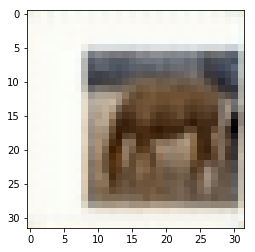

(3, 32, 32)


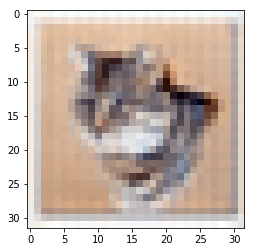

(3, 32, 32)


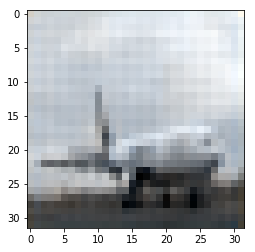

(3, 32, 32)


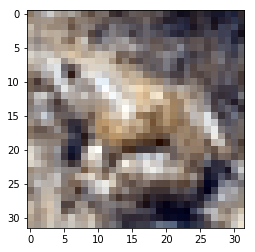

epoch [5/5], loss:0.0113


In [101]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder,self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1), # input_channels, output_channels, filter_size, stride
            nn.ReLU(True),
            nn.Conv2d(3, 32, kernel_size=2, stride=2, padding=0),
            nn.ReLU(True), #inplace = True
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, kernel_size=2, stride=2, padding=0),
            nn.ReLU(True),
            nn.ConvTranspose2d(3, 3, kernel_size=3, stride=1, padding=1),
            #nn.ReLU(True),
       
        )
        
    def forward(self,x):
        x=self.encoder(x) # x.shape = torch.Size([1, 5, 14, 14])
        x=self.decoder(x)
        return x
    


model = Autoencoder().cpu()
distance = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.01, weight_decay=1e-5)
#optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
i = 1
num_epochs = 5
for epoch in range(5):
    for data in trainloader:
        img, _ = data
        
        # ===================forward=====================
        output = model(img)
        #print(output[1])
        if epoch == 4:
            with torch.no_grad():
                imshow_decoder(output[1])

        loss = distance(output, img)
        # ===================backward====================
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        i = i+1
    print('epoch [{}/{}], loss:{:.4f}'.format(epoch+1, num_epochs, loss.item()))